In [1]:
# Make Jupyter full screen (not necessary on Colab)
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

#### Import Libraries

In [2]:
# pip install -q hvplot

In [3]:
#
import numpy as np
import pandas as pd
import plotly.express as px
# import tkinter
# from matplotlib import pyplot as plt
from sklearn.model_selection import cross_val_score
from collections import Counter

import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import gc
# warnings.simplefilter(action='ignore', category="FutureWarning")
# warnings.simplefilter(action='ignore', category="DeprecationWarning")
%matplotlib inline

# sys.path.append(os.path.abspath("/home/laklevi1/anarh/Seminarcode/"))
# from petrology_util_funcs import *

import pandas as pd
import numpy as np
import seaborn as sns
from scipy import stats 
import matplotlib.pyplot as plt
import hvplot.pandas

from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import MinMaxScaler

from sklearn.metrics import (
    accuracy_score, confusion_matrix, classification_report, 
    roc_auc_score, roc_curve, auc,
    plot_confusion_matrix, plot_roc_curve
)
from sklearn.metrics import ConfusionMatrixDisplay, RocCurveDisplay

from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier

import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization 
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import AUC

pd.set_option('display.float', '{:.2f}'.format)
pd.set_option('display.max_columns', 50)
pd.set_option('display.max_rows', 50)

from subprocess import check_output
%config Completer.use_jedi = False
%load_ext watermark
%watermark --iversions

/home/laklevi1/anarh/projectA/env/lib/python3.8/site-packages/xgboost/compat.py:31: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


hvplot    : 0.8.4
pandas    : 1.4.3
tensorflow: 2.7.0
matplotlib: 3.5.2
scipy     : 1.7.3
numpy     : 1.21.5
seaborn   : 0.11.1
plotly    : 4.14.3



* https://www.kaggle.com/code/faressayah/lending-club-loan-defaulters-prediction

In [4]:
# from importlib import reload 
# import logging, sys
# reload(logging)
# logging.basicConfig(filename = 'loanDefault.log', 
#                     level = logging.DEBUG,
#                     format='%(asctime)s - %(message)s', 
#                     datefmt='%d-%b-%y %H:%M:%S',
#                    force = True
#                    )

# import logging
# logger = logging.getLogger()
# fhandler = logging.FileHandler(filename='loanDefault.log', mode='a')
# formatter = logging.Formatter('%(asctime)s - %(name)s - %(levelname)s - %(message)s')
# fhandler.setFormatter(formatter)
# logger.addHandler(fhandler)
# logger.setLevel(logging.DEBUG)

import sys
import logging

logging.basicConfig(
    format='%(asctime)s [%(levelname)s] %(name)s - %(message)s',
    level=logging.INFO,
    datefmt='%Y-%m-%d %H:%M:%S',
    stream=sys.stdout,
)
log = logging.getLogger('notebook')

In [5]:
SEED = 142

In [6]:
ptdir = "./"
print(check_output(["ls", "{}".format(ptdir)]).decode("utf8"))

DOC-20230729-WA0000.xlsx
Joyce_project.ipynb
OVERALL.xlsx
Sharon_polygon-Copy1.ipynb
Untitled.ipynb
archive
baised.pdf
baised.png
loanDefault.log
loan_default_Edit_0.ipynb
loan_default_Edit_1.ipynb
loan_default_Edit_2-Copy1.ipynb
loan_default_Edit_2-Copy2.ipynb
loan_default_Edit_2.ipynb
pipeline.html
unbaised.pdf
unbaised.png
veg_missing_data_.png
vegbaised.pdf
vegbaised.png
vis_missing_data_.png
visualizing_missing_data_.png
visualizing_missing_data_with_barplot_Seaborn_distplot.png



#### Import Data

In [7]:
curDir = '/home/laklevi1/anarh/Loan Defualt PhD Project'

In [8]:
data_info = pd.read_csv(curDir + '/archive/lending_club_info.csv', index_col='LoanStatNew')
data_info

,Description
LoanStatNew,
loan_amnt,The listed amount of the loan applied for by t...
term,The number of payments on the loan. Values are...
int_rate,Interest Rate on the loan
installment,The monthly payment owed by the borrower if th...
grade,LC assigned loan grade
sub_grade,LC assigned loan subgrade
emp_title,The job title supplied by the Borrower when ap...
emp_length,Employment length in years. Possible values ar...
home_ownership,The home ownership status provided by the borr...


In [9]:
# Create the helper function 
def feat_info(col_name):
    
    print(data_info.loc[col_name]['Description'])

In [10]:
feat_info('mort_acc')

Number of mortgage accounts.


In [11]:
# load the data 
data = pd.read_csv(curDir + '/archive/lending_club_loan_two.csv')
data.head(n=14)

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,title,dti,earliest_cr_line,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies,address
0,10000.00,36 months,11.44,329.48,B,B4,Marketing,10+ years,RENT,117000.00,Not Verified,Jan-2015,Fully Paid,vacation,Vacation,26.24,Jun-1990,16.00,0.00,36369.00,41.80,25.00,w,INDIVIDUAL,0.00,0.00,"0174 Michelle Gateway\r\nMendozaberg, OK 22690"
1,8000.00,36 months,11.99,265.68,B,B5,Credit analyst,4 years,MORTGAGE,65000.00,Not Verified,Jan-2015,Fully Paid,debt_consolidation,Debt consolidation,22.05,Jul-2004,17.00,0.00,20131.00,53.30,27.00,f,INDIVIDUAL,3.00,0.00,"1076 Carney Fort Apt. 347\r\nLoganmouth, SD 05113"
2,15600.00,36 months,10.49,506.97,B,B3,Statistician,< 1 year,RENT,43057.00,Source Verified,Jan-2015,Fully Paid,credit_card,Credit card refinancing,12.79,Aug-2007,13.00,0.00,11987.00,92.20,26.00,f,INDIVIDUAL,0.00,0.00,"87025 Mark Dale Apt. 269\r\nNew Sabrina, WV 05113"
3,7200.00,36 months,6.49,220.65,A,A2,Client Advocate,6 years,RENT,54000.00,Not Verified,Nov-2014,Fully Paid,credit_card,Credit card refinancing,2.60,Sep-2006,6.00,0.00,5472.00,21.50,13.00,f,INDIVIDUAL,0.00,0.00,"823 Reid Ford\r\nDelacruzside, MA 00813"
4,24375.00,60 months,17.27,609.33,C,C5,Destiny Management Inc.,9 years,MORTGAGE,55000.00,Verified,Apr-2013,Charged Off,credit_card,Credit Card Refinance,33.95,Mar-1999,13.00,0.00,24584.00,69.80,43.00,f,INDIVIDUAL,1.00,0.00,"679 Luna Roads\r\nGreggshire, VA 11650"
5,20000.00,36 months,13.33,677.07,C,C3,HR Specialist,10+ years,MORTGAGE,86788.00,Verified,Sep-2015,Fully Paid,debt_consolidation,Debt consolidation,16.31,Jan-2005,8.00,0.00,25757.00,100.60,23.00,f,INDIVIDUAL,4.00,0.00,1726 Cooper Passage Suite 129\r\nNorth Deniseb...
6,18000.00,36 months,5.32,542.07,A,A1,Software Development Engineer,2 years,MORTGAGE,125000.00,Source Verified,Sep-2015,Fully Paid,home_improvement,Home improvement,1.36,Aug-2005,8.00,0.00,4178.00,4.90,25.00,f,INDIVIDUAL,3.00,0.00,"1008 Erika Vista Suite 748\r\nEast Stephanie, ..."
7,13000.00,36 months,11.14,426.47,B,B2,Office Depot,10+ years,RENT,46000.00,Not Verified,Sep-2012,Fully Paid,credit_card,No More Credit Cards,26.87,Sep-1994,11.00,0.00,13425.00,64.50,15.00,f,INDIVIDUAL,0.00,0.00,USCGC Nunez\r\nFPO AE 30723
8,18900.00,60 months,10.99,410.84,B,B3,Application Architect,10+ years,RENT,103000.00,Verified,Oct-2014,Fully Paid,debt_consolidation,Debt consolidation,12.52,Jun-1994,13.00,0.00,18637.00,32.90,40.00,w,INDIVIDUAL,3.00,0.00,USCGC Tran\r\nFPO AP 22690
9,26300.00,36 months,16.29,928.40,C,C5,Regado Biosciences,3 years,MORTGAGE,115000.00,Verified,Apr-2012,Fully Paid,debt_consolidation,Debt Consolidation,23.69,Dec-1997,13.00,0.00,22171.00,82.40,37.00,f,INDIVIDUAL,1.00,0.00,"3390 Luis Rue\r\nMauricestad, VA 00813"


In [12]:
data.columns

Index(['loan_amnt', 'term', 'int_rate', 'installment', 'grade', 'sub_grade',
       'emp_title', 'emp_length', 'home_ownership', 'annual_inc',
       'verification_status', 'issue_d', 'loan_status', 'purpose', 'title',
       'dti', 'earliest_cr_line', 'open_acc', 'pub_rec', 'revol_bal',
       'revol_util', 'total_acc', 'initial_list_status', 'application_type',
       'mort_acc', 'pub_rec_bankruptcies', 'address'],
      dtype='object')

In [13]:
data.describe()

,loan_amnt,int_rate,installment,annual_inc,dti,open_acc,pub_rec,revol_bal,revol_util,total_acc,mort_acc,pub_rec_bankruptcies
count,396030.00,396030.00,396030.00,396030.00,396030.00,396030.00,396030.00,396030.00,395754.00,396030.00,358235.00,395495.00
mean,14113.89,13.64,431.85,74203.18,17.38,11.31,0.18,15844.54,53.79,25.41,1.81,0.12
std,8357.44,4.47,250.73,61637.62,18.02,5.14,0.53,20591.84,24.45,11.89,2.15,0.36
min,500.00,5.32,16.08,0.00,0.00,0.00,0.00,0.00,0.00,2.00,0.00,0.00
25%,8000.00,10.49,250.33,45000.00,11.28,8.00,0.00,6025.00,35.80,17.00,0.00,0.00
50%,12000.00,13.33,375.43,64000.00,16.91,10.00,0.00,11181.00,54.80,24.00,1.00,0.00
75%,20000.00,16.49,567.30,90000.00,22.98,14.00,0.00,19620.00,72.90,32.00,3.00,0.00
max,40000.00,30.99,1533.81,8706582.00,9999.00,90.00,86.00,1743266.00,892.30,151.00,34.00,8.00


In [14]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 396030 entries, 0 to 396029
Data columns (total 27 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   loan_amnt             396030 non-null  float64
 1   term                  396030 non-null  object 
 2   int_rate              396030 non-null  float64
 3   installment           396030 non-null  float64
 4   grade                 396030 non-null  object 
 5   sub_grade             396030 non-null  object 
 6   emp_title             373103 non-null  object 
 7   emp_length            377729 non-null  object 
 8   home_ownership        396030 non-null  object 
 9   annual_inc            396030 non-null  float64
 10  verification_status   396030 non-null  object 
 11  issue_d               396030 non-null  object 
 12  loan_status           396030 non-null  object 
 13  purpose               396030 non-null  object 
 14  title                 394275 non-null  object 
 15  

* Loan status

In [15]:
data['loan_status'].value_counts().hvplot.bar(
    title="Loan Status Counts", xlabel='Loan Status', ylabel='Count', 
    width=500, height=350
)

:Bars   [index]   (loan_status)

* correlation

<AxesSubplot:>

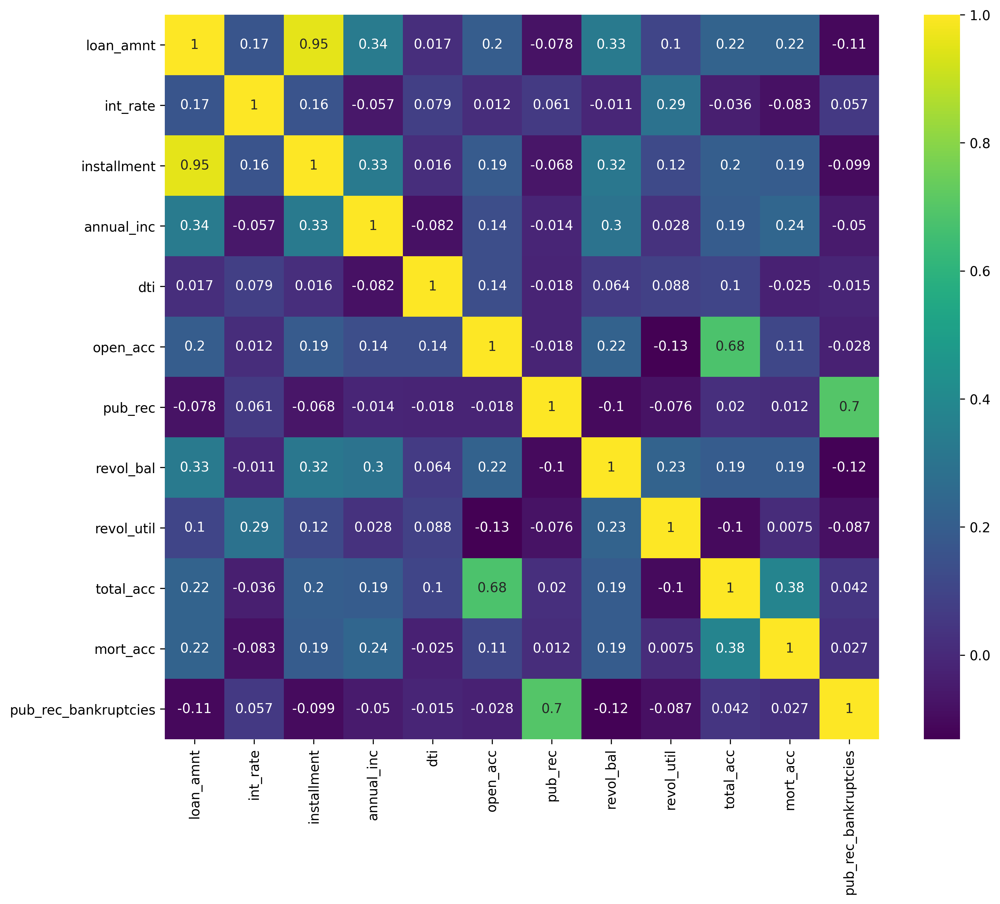

In [16]:
plt.figure(figsize=(12, 10), dpi=300)
sns.heatmap(data.corr(), annot=True, cmap='viridis')

* loan_amnt \& installment

 ** installment: The monthly payment owed by the borrower if the loan originates.
 
 ** loan_amnt: The listed amount of the loan applied for by the borrower. If at some point in time, the credit department reduces the loan amount, then it will be reflected in this value.

In [17]:
installment = data.hvplot.hist(
                            y='installment', 
                            by='loan_status',
                            subplots=False, 
                            width=350, 
                            height=400,
                            bins=50,
                            alpha=0.4, 
                            title="Installment by Loan Status", 
                            xlabel='Installment', 
                            ylabel='Counts',
                            legend='top'
                        )

loan_amnt = data.hvplot.hist(
                            y='loan_amnt',
                            by='loan_status',
                            subplots=False, 
                            width=350,
                            height=400, 
                            bins=30,
                            alpha=0.4, 
                            title="Loan Amount by Loan Status", 
                            xlabel='Loan Amount',
                            ylabel='Counts',
                            legend='top'
                        )

installment + loan_amnt

:Layout
   .NdOverlay.I  :NdOverlay   [loan_status]
      :Histogram   [installment]   (installment_count)
   .NdOverlay.II :NdOverlay   [loan_status]
      :Histogram   [loan_amnt]   (loan_amnt_count)

In [18]:
loan_amnt_box = data.hvplot.box(
    y='loan_amnt', subplots=True, by='loan_status', width=300, height=350, 
    title="Loan Status by Loan Amount ", xlabel='Loan Status', ylabel='Loan Amount'
)

installment_box = data.hvplot.box(
    y='installment', subplots=True, by='loan_status', width=300, height=350, 
    title="Loan Status by Installment", xlabel='Loan Status', ylabel='Installment'
)

loan_amnt_box + installment_box

:Layout
   .BoxWhisker.I  :BoxWhisker   [loan_status]   (loan_amnt)
   .BoxWhisker.II :BoxWhisker   [loan_status]   (installment)

In [19]:
data.groupby(by='loan_status')['loan_amnt'].describe()

,count,mean,std,min,25%,50%,75%,max
loan_status,,,,,,,,
Charged Off,77673.00,15126.30,8505.09,1000.00,8525.00,14000.00,20000.00,40000.00
Fully Paid,318357.00,13866.88,8302.32,500.00,7500.00,12000.00,19225.00,40000.00


* grade \& sub_grade

* grade: LC assigned loan grade
* sub_grade: LC assigned loan subgrade


In [20]:
print(f"GRADE unique: {data.grade.unique()}")
print(f"SUB_GRADE unique: {data.sub_grade.unique()}")

GRADE unique: ['B' 'A' 'C' 'E' 'D' 'F' 'G']
SUB_GRADE unique: ['B4' 'B5' 'B3' 'A2' 'C5' 'C3' 'A1' 'B2' 'C1' 'A5' 'E4' 'A4' 'A3' 'D1'
 'C2' 'B1' 'D3' 'D5' 'D2' 'E1' 'E2' 'E5' 'F4' 'E3' 'D4' 'G1' 'F5' 'G2'
 'C4' 'F1' 'F3' 'G5' 'G4' 'F2' 'G3']


In [21]:
fully_paid = data.loc[data['loan_status']=='Fully Paid', 'grade'].value_counts().hvplot.bar() 
charged_off = data.loc[data['loan_status']=='Charged Off', 'grade'].value_counts().hvplot.bar() 

grades = (fully_paid * charged_off).opts(
    title="Loan Status by Grade", xlabel='Grades', ylabel='Count',
    width=500, height=450, legend_cols=2, legend_position='top_right'
)

fully_paid = data.loc[data['loan_status']=='Fully Paid', 'sub_grade'].value_counts().hvplot.bar() 
charged_off = data.loc[data['loan_status']=='Charged Off', 'sub_grade'].value_counts().hvplot.bar() 

sub_grades = (fully_paid * charged_off).opts(
    title="Loan Status by Grade", xlabel='Grades', ylabel='Count',
    width=500, height=450, legend_cols=2, legend_position='top_right', 
    shared_axes=False
)

grades + sub_grades

:Layout
   .Overlay.Grade     :Overlay
      .Bars.Grade.I  :Bars   [index]   (grade)
      .Bars.Grade.II :Bars   [index]   (grade)
   .Overlay.Sub_grade :Overlay
      .Bars.Sub_grade.I  :Bars   [index]   (sub_grade)
      .Bars.Sub_grade.II :Bars   [index]   (sub_grade)

In [22]:
fully_paid = data.loc[data['loan_status']=='Fully Paid', 'grade'].value_counts().hvplot.bar() 
charged_off = data.loc[data['loan_status']=='Charged Off', 'grade'].value_counts().hvplot.bar() 

(fully_paid * charged_off).opts(
    title="Loan Status by Grade", xlabel='Grades', ylabel='Count',
    width=500, height=450, legend_cols=2, legend_position='top_right', xrotation=90
)

:Overlay
   .Bars.Grade.I  :Bars   [index]   (grade)
   .Bars.Grade.II :Bars   [index]   (grade)

In [23]:
fully_paid = data.loc[data['loan_status']=='Fully Paid', 'sub_grade'].value_counts().hvplot.bar() 
charged_off = data.loc[data['loan_status']=='Charged Off', 'sub_grade'].value_counts().hvplot.bar() 

(fully_paid * charged_off).opts(
    title="Loan Status by Grade", xlabel='Grades', ylabel='Count',
    width=500, height=400, legend_cols=2, legend_position='top_right', xrotation=90
)

:Overlay
   .Bars.Sub_grade.I  :Bars   [index]   (sub_grade)
   .Bars.Sub_grade.II :Bars   [index]   (sub_grade)

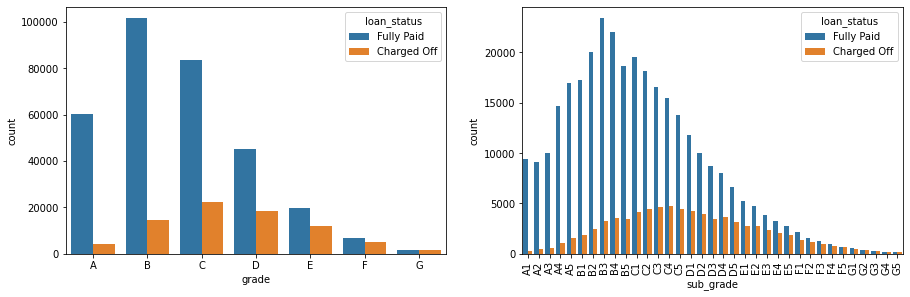

In [24]:
plt.figure(figsize=(15, 10))

plt.subplot(2, 2, 1)
grade = sorted(data.grade.unique().tolist())
sns.countplot(x='grade', data=data, hue='loan_status', order=grade)

plt.subplot(2, 2, 2)
sub_grade = sorted(data.sub_grade.unique().tolist())
g = sns.countplot(x='sub_grade', data=data, hue='loan_status', order=sub_grade)
g.set_xticklabels(g.get_xticklabels(), rotation=90);

It looks like F and G subgrades don't get paid back that often. Isloate those and recreate the countplot just for those subgrades.

<AxesSubplot:xlabel='sub_grade', ylabel='count'>

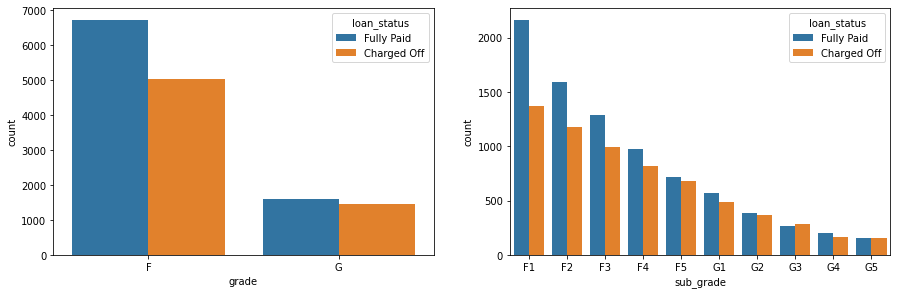

In [25]:
df = data[(data.grade == 'F') | (data.grade == 'G')]

plt.figure(figsize=(15, 10))

plt.subplot(2, 2, 1)
grade = sorted(df.grade.unique().tolist())
sns.countplot(x='grade', data=df, hue='loan_status', order=grade)

plt.subplot(2, 2, 2)
sub_grade = sorted(df.sub_grade.unique().tolist())
sns.countplot(x='sub_grade', data=df, hue='loan_status', order=sub_grade)

**term, home_ownership, verification_status \& purpose**

* term: The number of payments on the loan. Values are in months and can be either 36 or 60.
* home_ownership: The home ownership status provided by the borrower during registration or obtained from the credit report. Our values are: RENT, OWN, MORTGAGE, OTHER
* verification_status: Indicates if income was verified by LC, not verified, or if the income source was verified
* purpose: A category provided by the borrower for the loan request.

In [26]:
data['home_ownership'].value_counts()

MORTGAGE    198348
RENT        159790
OWN          37746
OTHER          112
NONE            31
ANY              3
Name: home_ownership, dtype: int64

In [27]:
fully_paid = data.loc[data['loan_status']=='Fully Paid', 'home_ownership'].value_counts().hvplot.bar() 
charged_off = data.loc[data['loan_status']=='Charged Off', 'home_ownership'].value_counts().hvplot.bar()

home_ownership_count = (fully_paid * charged_off).opts(
    title="Loan Status by Grade", xlabel='Home Ownership', ylabel='Count',
    width=350, height=350, legend_cols=2, legend_position='top_right'
).opts(xrotation=90)

home_ownership = data.home_ownership.value_counts().hvplot.bar(
    title="Loan Status by Grade", xlabel='Home Ownership', ylabel='Count', 
    width=350, height=350, legend='top'
).opts(xrotation=90)

(home_ownership_count + home_ownership)

:Layout
   .Overlay.Home_ownership :Overlay
      .Bars.Home_ownership.I  :Bars   [index]   (home_ownership)
      .Bars.Home_ownership.II :Bars   [index]   (home_ownership)
   .Bars.Home_ownership    :Bars   [index]   (home_ownership)

In [28]:
data.loc[(data.home_ownership == 'ANY') | (data.home_ownership == 'NONE'), 'home_ownership'] = 'OTHER'  
data.home_ownership.value_counts()

MORTGAGE    198348
RENT        159790
OWN          37746
OTHER          146
Name: home_ownership, dtype: int64

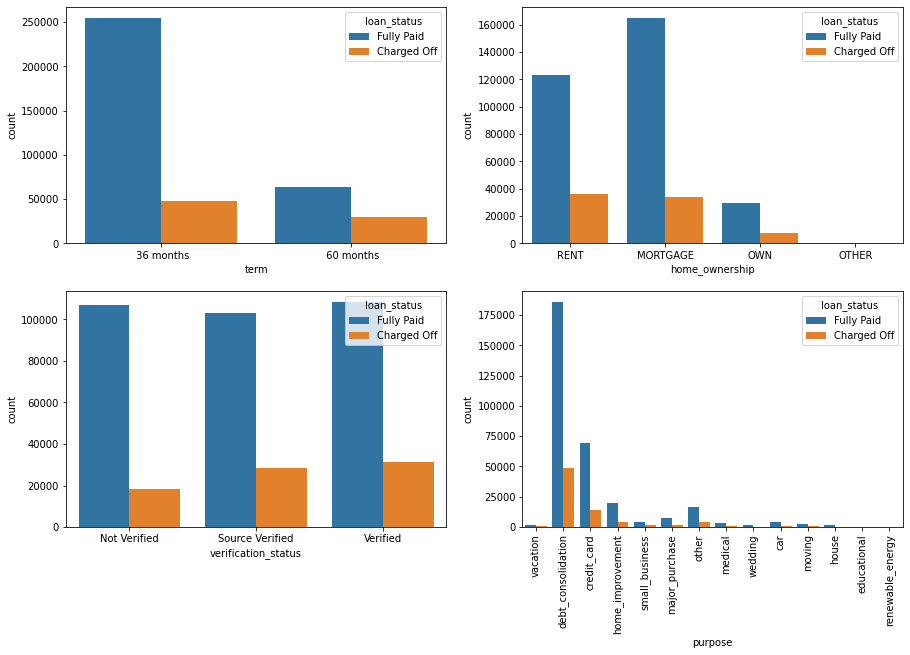

In [29]:
plt.figure(figsize=(15, 20))

plt.subplot(4, 2, 1)
sns.countplot(x='term', data=data, hue='loan_status')

plt.subplot(4, 2, 2)
sns.countplot(x='home_ownership', data=data, hue='loan_status')

plt.subplot(4, 2, 3)
sns.countplot(x='verification_status', data=data, hue='loan_status')

plt.subplot(4, 2, 4)
g = sns.countplot(x='purpose', data=data, hue='loan_status')
g.set_xticklabels(g.get_xticklabels(), rotation=90);

In [30]:
data.loc[data['home_ownership']=='OTHER', 'loan_status'].value_counts()


Fully Paid     123
Charged Off     23
Name: loan_status, dtype: int64

**int_rate \& annual_inc**

* int_rate: Interest Rate on the loan
* annual_inc: The self-reported annual income provided by the borrower during registration

In [31]:
int_rate = data.hvplot.hist(
    y='int_rate', by='loan_status', alpha=0.3, width=350, height=400,
    title="Loan Status by Interest Rate", xlabel='Interest Rate', ylabel='Loans Counts', 
    legend='top'
)

annual_inc = data.hvplot.hist(
    y='annual_inc', by='loan_status', bins=50, alpha=0.3, width=350, height=400,
    title="Loan Status by Annual Income", xlabel='Annual Income', ylabel='Loans Counts', 
    legend='top'
).opts(xrotation=45)

int_rate + annual_inc

:Layout
   .NdOverlay.I  :NdOverlay   [loan_status]
      :Histogram   [int_rate]   (int_rate_count)
   .NdOverlay.II :NdOverlay   [loan_status]
      :Histogram   [annual_inc]   (annual_inc_count)

In [32]:
data[data.annual_inc <= 250000].hvplot.hist(
    y='annual_inc', by='loan_status', bins=50, alpha=0.3, width=500, height=400,
    title="Loan Status by Annual Income (<= 250000/Year)", 
    xlabel='Annual Income', ylabel='Loans Counts', legend='top'
).opts(xrotation=45)

:NdOverlay   [loan_status]
   :Histogram   [annual_inc]   (annual_inc_count)

In [33]:
print((data[data.annual_inc >= 250000].shape[0] / data.shape[0]) * 100)
print((data[data.annual_inc >= 1000000].shape[0] / data.shape[0]) * 100)

1.0294674645860162
0.018937959245511705


In [34]:
data.loc[data.annual_inc >= 1000000, 'loan_status'].value_counts()

Fully Paid     65
Charged Off    10
Name: loan_status, dtype: int64

In [35]:
data.loc[data.annual_inc >= 250000, 'loan_status'].value_counts()

Fully Paid     3509
Charged Off     568
Name: loan_status, dtype: int64

* It seems that loans with high intersest rate are more likely to be unpaid.
* Only 75 (less then) borrowers have an annual income more than 1 million, and 4077

**emp_title \& emp_length**

* emp_title: The job title supplied by the Borrower when applying for the loan.
    
* emp_length: Employment length in years. Possible values are between 0 and 10 where 0 means less than one year and 10 means ten or more years.

In [36]:
print(data.emp_title.isna().sum())
print(data.emp_title.nunique())

22927
173105


In [37]:
data['emp_title'].value_counts()[:20]

Teacher                     4389
Manager                     4250
Registered Nurse            1856
RN                          1846
Supervisor                  1830
Sales                       1638
Project Manager             1505
Owner                       1410
Driver                      1339
Office Manager              1218
manager                     1145
Director                    1089
General Manager             1074
Engineer                     995
teacher                      962
driver                       882
Vice President               857
Operations Manager           763
Administrative Assistant     756
Accountant                   748
Name: emp_title, dtype: int64

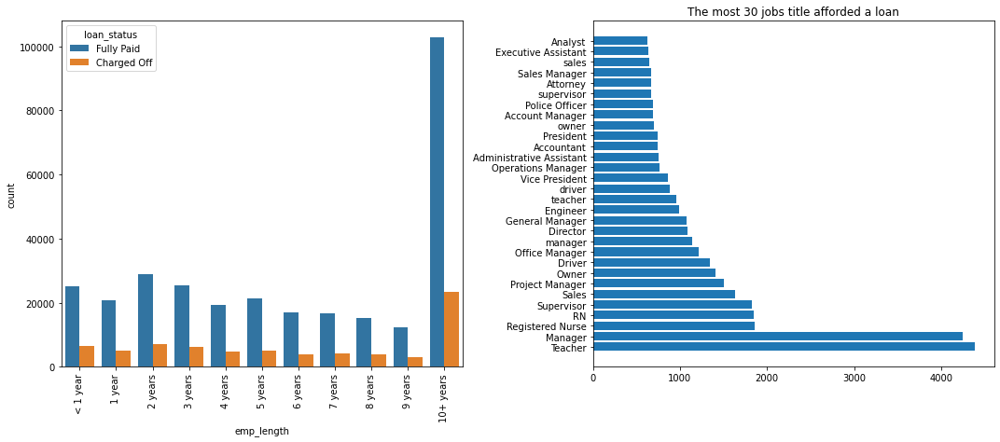

In [38]:
plt.figure(figsize=(15, 12))

plt.subplot(2, 2, 1)
order = ['< 1 year', '1 year', '2 years', '3 years', '4 years', '5 years', 
          '6 years', '7 years', '8 years', '9 years', '10+ years',]
g = sns.countplot(x='emp_length', data=data, hue='loan_status', order=order)
g.set_xticklabels(g.get_xticklabels(), rotation=90);

plt.subplot(2, 2, 2)
plt.barh(data.emp_title.value_counts()[:30].index, data.emp_title.value_counts()[:30])
plt.title("The most 30 jobs title afforded a loan")
plt.tight_layout()

**issue_d, earliest_cr_line**

* issue_d: The month which the loan was funded
    
* earliest_cr_line: The month the borrower's earliest reported credit line was opened

In [39]:
# data.hvplot.line(x='issue_d', y='loan_status')
data['earliest_cr_line'].value_counts()

Oct-2000    3017
Aug-2000    2935
Oct-2001    2896
Aug-2001    2884
Nov-2000    2736
            ... 
Jul-1958       1
Nov-1957       1
Jan-1953       1
Jul-1955       1
Aug-1959       1
Name: earliest_cr_line, Length: 684, dtype: int64

In [40]:
data['issue_d'] = pd.to_datetime(data['issue_d'])
data['earliest_cr_line'] = pd.to_datetime(data['earliest_cr_line'])

In [41]:
fully_paid = data.loc[data['loan_status']=='Fully Paid', 'issue_d'].hvplot.hist(bins=35) 
charged_off = data.loc[data['loan_status']=='Charged Off', 'issue_d'].hvplot.hist(bins=35)

# fully_paid * charged_off
loan_issue_date = (fully_paid * charged_off).opts(
    title="Loan Status by Loan Issue Date", xlabel='Loan Issue Date', ylabel='Count',
    width=350, height=350, legend_cols=2, legend_position='top_right'
).opts(xrotation=45)

fully_paid = data.loc[data['loan_status']=='Fully Paid', 'earliest_cr_line'].hvplot.hist(bins=35) 
charged_off = data.loc[data['loan_status']=='Charged Off', 'earliest_cr_line'].hvplot.hist(bins=35)

earliest_cr_line = (fully_paid * charged_off).opts(
    title="Loan Status by earliest_cr_line", xlabel='earliest_cr_line', ylabel='Count',
    width=350, height=350, legend_cols=2, legend_position='top_right'
).opts(xrotation=45)

loan_issue_date + earliest_cr_line

:Layout
   .Overlay.I  :Overlay
      .Histogram.I  :Histogram   [issue_d]   (issue_d_count)
      .Histogram.II :Histogram   [issue_d]   (issue_d_count)
   .Overlay.II :Overlay
      .Histogram.I  :Histogram   [earliest_cr_line]   (earliest_cr_line_count)
      .Histogram.II :Histogram   [earliest_cr_line]   (earliest_cr_line_count)

**title**

* title: The loan title provided by the borrower

In [42]:
data.title.isna().sum()

1755

In [43]:
data['title'] = data.title.str.lower()
data.title.value_counts()[:10]

debt consolidation           168108
credit card refinancing       51781
home improvement              17117
other                         12993
consolidation                  5583
major purchase                 4998
debt consolidation loan        3513
business                       3017
medical expenses               2820
credit card consolidation      2638
Name: title, dtype: int64

title will be removed because we have the purpose column with is generated from it.

**dti, open_acc, revol_bal, revol_util, \& total_acc**

* dti: A ratio calculated using the borrower’s total monthly debt payments on the total debt obligations, excluding mortgage and the requested LC loan, divided by the borrower’s self-reported monthly income.

* open_acc: The number of open credit lines in the borrower's credit file.

* revol_bal: Total credit revolving balance

* revol_util: Revolving line utilization rate, or the amount of credit the borrower is using relative to all available revolving credit.

* total_acc: The total number of credit lines currently in the borrower's credit file

In [44]:
data.dti.value_counts()

0.00     313
14.40    310
19.20    302
16.80    301
18.00    300
        ... 
59.18      1
48.37      1
45.71      1
42.38      1
55.53      1
Name: dti, Length: 4262, dtype: int64

In [45]:
dti = data.hvplot.hist(
    y='dti', bins=50, width=350, height=350, 
    title="dti Distribution", xlabel='dti', ylabel='Count'
)

sub_dti = data[data['dti']<=50].hvplot.hist(
    y='dti', bins=50, width=350, height=350, 
    title="dti (<=30) Distribution", xlabel='dti', ylabel='Count', shared_axes=False
)

dti + sub_dti

:Layout
   .Histogram.I  :Histogram   [dti]   (dti_count)
   .Histogram.II :Histogram   [dti]   (dti_count)

In [46]:
print(data[data['dti']>=40].shape)

(296, 27)


In [47]:
data.loc[data['dti']>=50, 'loan_status'].value_counts()

Fully Paid     26
Charged Off     9
Name: loan_status, dtype: int64

In [48]:
dti = data[data['dti']<=50].hvplot.hist(
    y='dti', by='loan_status', bins=50, width=300, height=350, 
    title="dti (<=30) Distribution", xlabel='dti', ylabel='Count', 
    alpha=0.3, legend='top'
)

title="Loan Status by The number of open credit lines"

open_acc = data.hvplot.hist(
    y='open_acc', by='loan_status', bins=50, width=300, height=350, 
    title=title, xlabel='The number of open credit lines', ylabel='Count', 
    alpha=0.4, legend='top'
)

title="Loan Status by The total number of credit lines"

total_acc = data.hvplot.hist(
    y='total_acc', by='loan_status', bins=50, width=300, height=350, 
    title=title, xlabel='The total number of credit lines', ylabel='Count', 
    alpha=0.4, legend='top'
)

dti + open_acc + total_acc

:Layout
   .NdOverlay.I   :NdOverlay   [loan_status]
      :Histogram   [dti]   (dti_count)
   .NdOverlay.II  :NdOverlay   [loan_status]
      :Histogram   [open_acc]   (open_acc_count)
   .NdOverlay.III :NdOverlay   [loan_status]
      :Histogram   [total_acc]   (total_acc_count)

In [49]:
print(data.shape)
print(data[data.open_acc > 40].shape)

(396030, 27)
(217, 27)


In [50]:
print(data.shape)
print(data[data.total_acc > 80].shape)

(396030, 27)
(266, 27)


In [51]:
print(data.shape)
print(data[data.revol_util > 120].shape)

(396030, 27)
(27, 27)


In [52]:
title="Loan Status by Revolving line utilization rate"

revol_util = data.hvplot.hist(
    y='revol_util', by='loan_status', bins=50, width=350, height=400, 
    title=title, xlabel='Revolving line utilization rate', ylabel='Count', 
    alpha=0.4, legend='top'
)

title="Loan Status by Revolving line utilization rate (<120)"

sub_revol_util = data[data.revol_util < 120].hvplot.hist(
    y='revol_util', by='loan_status', bins=50, width=350, height=400, 
    title=title, xlabel='Revolving line utilization rate', ylabel='Count', 
    shared_axes=False, alpha=0.4, legend='top'
)

revol_util + sub_revol_util

:Layout
   .NdOverlay.I  :NdOverlay   [loan_status]
      :Histogram   [revol_util]   (revol_util_count)
   .NdOverlay.II :NdOverlay   [loan_status]
      :Histogram   [revol_util]   (revol_util_count)

In [53]:
data[data.revol_util > 200]

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,title,dti,earliest_cr_line,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies,address
137211,3500.00,36 months,12.49,117.08,B,B4,Budget Analyst,10+ years,RENT,45000.00,Verified,2014-04-01,Fully Paid,debt_consolidation,debt consolidation,14.67,1998-10-01,2.00,0.00,2677.00,892.30,9.00,f,INDIVIDUAL,0.00,0.00,"12506 Connie Burg\r\nVelasquezfort, TN 00813"


In [54]:
print(data.shape)
print(data[data.revol_bal > 250000].shape)

(396030, 27)
(397, 27)


In [55]:
title = "Loan Status by Total credit revolving balance"

revol_bal = data.hvplot.hist(
    y='revol_bal', by='loan_status', bins=50, width=350, height=400, 
    title=title, xlabel='Total credit revolving balance', ylabel='Count', 
    alpha=0.4, legend='top'
)

title = "Loan Status by Total credit revolving balance (<250000)"

sub_revol_bal = data[data['revol_bal']<=250000].hvplot.hist(
    y='revol_bal', by='loan_status', bins=50, width=350, height=400, 
    title=title, xlabel='Total credit revolving balance', ylabel='Count', 
    alpha=0.4, legend='top', shared_axes=False
).opts(xrotation=45)

revol_bal + sub_revol_bal

:Layout
   .NdOverlay.I  :NdOverlay   [loan_status]
      :Histogram   [revol_bal]   (revol_bal_count)
   .NdOverlay.II :NdOverlay   [loan_status]
      :Histogram   [revol_bal]   (revol_bal_count)

In [56]:
data.loc[data.revol_bal > 250000, 'loan_status'].value_counts()

Fully Paid     351
Charged Off     46
Name: loan_status, dtype: int64

* It seems that the smaller the dti the more likely that the loan will not be paid.
* Only 217 borrower have more than 40 open credit lines.
* Only 266 borrower have more than 80 credit line in the borrower credit file.

**pub_rec, initial_list_status, application_type, mort_acc, \& pub_rec_bankruptcies**

* pub_rec: Number of derogatory public records
* initial_list_status: The initial listing status of the loan. Possible values are – W, F
* application_type: Indicates whether the loan is an individual application or a joint application with two co-borrowers
* mort_acc: Number of mortgage accounts
pub_rec_bankruptcies: Number of public record bankruptcies

In [57]:
xlabel = 'Number of derogatory public records'
title = "Loan Status by Number of derogatory public records"

fully_paid = data.loc[data['loan_status']=='Fully Paid', 'pub_rec'].value_counts().hvplot.bar() 
charged_off = data.loc[data['loan_status']=='Charged Off', 'pub_rec'].value_counts().hvplot.bar()

(fully_paid * charged_off).opts(
    title=title, xlabel=xlabel, ylabel='Count',
    width=400, height=400, legend_cols=2, legend_position='top_right'
)


:Overlay
   .Bars.Pub_rec.I  :Bars   [index]   (pub_rec)
   .Bars.Pub_rec.II :Bars   [index]   (pub_rec)

In [58]:
xlabel = "The initial listing status of the loan"
title = "Loan Status by The initial listing status of the loan"

fully_paid = data.loc[data['loan_status']=='Fully Paid', 'initial_list_status'].value_counts().hvplot.bar() 
charged_off = data.loc[data['loan_status']=='Charged Off', 'initial_list_status'].value_counts().hvplot.bar()

(fully_paid * charged_off).opts(
    title=title, xlabel=xlabel, ylabel='Count',
    width=400, height=400, legend_cols=2, legend_position='top_right'
)

:Overlay
   .Bars.Initial_list_status.I  :Bars   [index]   (initial_list_status)
   .Bars.Initial_list_status.II :Bars   [index]   (initial_list_status)

In [59]:
fully_paid = data.loc[data['loan_status']=='Fully Paid', 'application_type'].value_counts().hvplot.bar() 
charged_off = data.loc[data['loan_status']=='Charged Off', 'application_type'].value_counts().hvplot.bar()

(fully_paid * charged_off).opts(
    title="Loan Status by Application Type", xlabel="Application Type", ylabel='Count',
    width=400, height=400, legend_cols=2, legend_position='top_right'
)

:Overlay
   .Bars.Application_type.I  :Bars   [index]   (application_type)
   .Bars.Application_type.II :Bars   [index]   (application_type)

In [60]:
xlabel = "Number of public record bankruptcies"
title = "Loan Status by The Number of public record bankruptcies"

fully_paid = data.loc[data['loan_status']=='Fully Paid', 'pub_rec_bankruptcies'].value_counts().hvplot.bar() 
charged_off = data.loc[data['loan_status']=='Charged Off', 'pub_rec_bankruptcies'].value_counts().hvplot.bar()

(fully_paid * charged_off).opts(
    title=title, xlabel=xlabel, ylabel='Count',
    width=400, height=400, legend_cols=2, legend_position='top_right'
)

:Overlay
   .Bars.Pub_rec_bankruptcies.I  :Bars   [index]   (pub_rec_bankruptcies)
   .Bars.Pub_rec_bankruptcies.II :Bars   [index]   (pub_rec_bankruptcies)

In [61]:
def pub_rec(number):
    if number == 0.0:
        return 0
    else:
        return 1
    
def mort_acc(number):
    if number == 0.0:
        return 0
    elif number >= 1.0:
        return 1
    else:
        return number
    
def pub_rec_bankruptcies(number):
    if number == 0.0:
        return 0
    elif number >= 1.0:
        return 1
    else:
        return number

In [62]:
data['pub_rec'] = data.pub_rec.apply(pub_rec)
data['mort_acc'] = data.mort_acc.apply(mort_acc)
data['pub_rec_bankruptcies'] = data.pub_rec_bankruptcies.apply(pub_rec_bankruptcies)

<AxesSubplot:xlabel='pub_rec_bankruptcies', ylabel='count'>

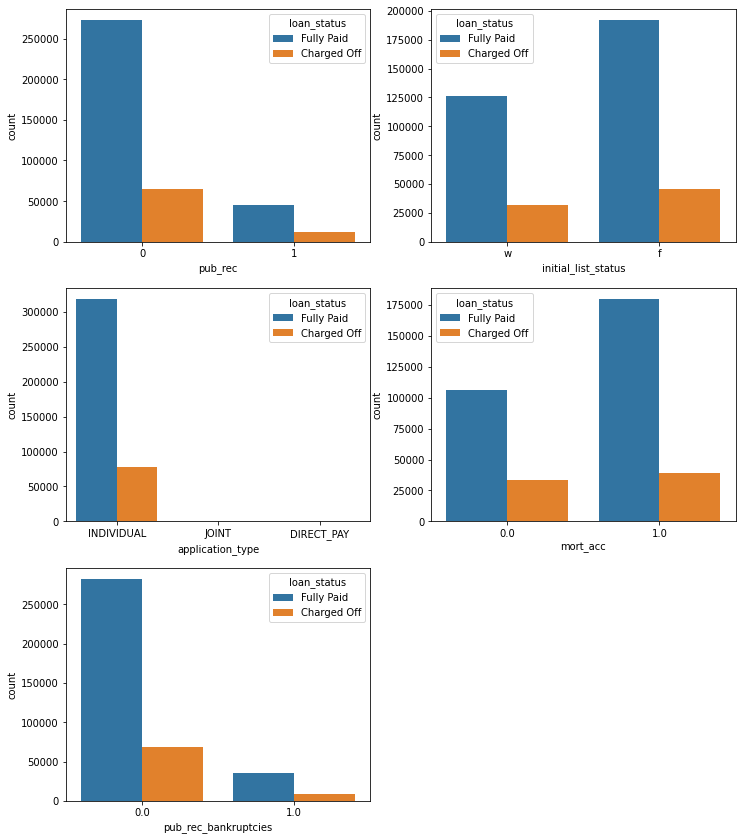

In [63]:
plt.figure(figsize=(12, 30))

plt.subplot(6, 2, 1)
sns.countplot(x='pub_rec', data=data, hue='loan_status')

plt.subplot(6, 2, 2)
sns.countplot(x='initial_list_status', data=data, hue='loan_status')

plt.subplot(6, 2, 3)
sns.countplot(x='application_type', data=data, hue='loan_status')

plt.subplot(6, 2, 4)
sns.countplot(x='mort_acc', data=data, hue='loan_status')

plt.subplot(6, 2, 5)
sns.countplot(x='pub_rec_bankruptcies', data=data, hue='loan_status')

In [64]:
data['loan_status'] = data.loan_status.map({'Fully Paid':1, 'Charged Off':0})

In [65]:
data.corr()['loan_status'].drop('loan_status').sort_values().hvplot.barh(
    width=600, height=400, 
    title="Correlation between Loan status and Numeric Features", 
    ylabel='Correlation', xlabel='Numerical Features', 
)

:Bars   [index]   (loan_status)

**Conclusion:**

We notice that, there are broadly three types of features:

* Features related to the applicant (demographic variables such as occupation, employment details etc.),

* Features related to loan characteristics (amount of loan, interest rate, purpose of loan etc.)

### Outliers Detection and Removing

* Data PreProcessing
    - Remove or fill any missing data.
    - Remove unnecessary or repetitive features.
    - Convert categorical string features to dummy variables.

In [66]:
# The length of the data
print(f"The Length of the data: {data.shape}")

The Length of the data: (396030, 27)


In [67]:
# Missing values
for column in data.columns:
    if data[column].isna().sum() != 0:
        missing = data[column].isna().sum()
        portion = (missing / data.shape[0]) * 100
        print(f"'{column}': number of missing values '{missing}' ==> '{portion:.3f}%'")


'emp_title': number of missing values '22927' ==> '5.789%'
'emp_length': number of missing values '18301' ==> '4.621%'
'title': number of missing values '1755' ==> '0.443%'
'revol_util': number of missing values '276' ==> '0.070%'
'mort_acc': number of missing values '37795' ==> '9.543%'
'pub_rec_bankruptcies': number of missing values '535' ==> '0.135%'


* emp_title

In [68]:
data.emp_title.nunique()

173105

Realistically there are too many unique job titles to try to convert this to a dummy variable feature. Let's remove that emp_title column

In [69]:
data.drop('emp_title', axis=1, inplace=True)

* emp_length

In [70]:
data.emp_length.unique()

array(['10+ years', '4 years', '< 1 year', '6 years', '9 years',
       '2 years', '3 years', '8 years', '7 years', '5 years', '1 year',
       nan], dtype=object)

In [71]:
for year in data.emp_length.unique():
    print(f"{year} years in this position:")
    print(f"{data[data.emp_length == year].loan_status.value_counts(normalize=True)}")
    print('==========================================')

10+ years years in this position:
1   0.82
0   0.18
Name: loan_status, dtype: float64
4 years years in this position:
1   0.81
0   0.19
Name: loan_status, dtype: float64
< 1 year years in this position:
1   0.79
0   0.21
Name: loan_status, dtype: float64
6 years years in this position:
1   0.81
0   0.19
Name: loan_status, dtype: float64
9 years years in this position:
1   0.80
0   0.20
Name: loan_status, dtype: float64
2 years years in this position:
1   0.81
0   0.19
Name: loan_status, dtype: float64
3 years years in this position:
1   0.80
0   0.20
Name: loan_status, dtype: float64
8 years years in this position:
1   0.80
0   0.20
Name: loan_status, dtype: float64
7 years years in this position:
1   0.81
0   0.19
Name: loan_status, dtype: float64
5 years years in this position:
1   0.81
0   0.19
Name: loan_status, dtype: float64
1 year years in this position:
1   0.80
0   0.20
Name: loan_status, dtype: float64
nan years in this position:
Series([], Name: loan_status, dtype: float64)


Charge off rates are extremely similar across all employment lengths. So we are going to drop the emp_length column.

In [72]:
data.drop('emp_length', axis=1, inplace=True)

* title

In [73]:
data.title.value_counts().head()

debt consolidation         168108
credit card refinancing     51781
home improvement            17117
other                       12993
consolidation                5583
Name: title, dtype: int64

In [74]:
data.purpose.value_counts().head()

debt_consolidation    234507
credit_card            83019
home_improvement       24030
other                  21185
major_purchase          8790
Name: purpose, dtype: int64

The title column is simply a string subcategory/description of the purpose column. So we are going to drop the title column.

data.drop('title', axis=1, inplace=True)

* mort_acc

There are many ways we could deal with this missing data. We could attempt to build a simple model to fill it in, such as a linear model, we could just fill it in based on the mean of the other columns, or you could even bin the columns into categories and then set NaN as its own category. There is no 100% correct approach!

Let's review the other columsn to see which most highly correlates to mort_acc

In [75]:
data.mort_acc.value_counts()

1.00    218458
0.00    139777
Name: mort_acc, dtype: int64

In [76]:
data.mort_acc.isna().sum()

37795

In [77]:
data.corr()['mort_acc'].drop('mort_acc').sort_values().hvplot.barh()

:Bars   [index]   (mort_acc)

Looks like the total_acc feature correlates with the mort_acc , this makes sense! Let's try this fillna() approach. We will group the dataframe by the total_acc and calculate the mean value for the mort_acc per total_acc entry. To get the result below:

In [78]:
total_acc_avg = data.groupby(by='total_acc').mean().mort_acc

In [79]:
def fill_mort_acc(total_acc, mort_acc):
    if np.isnan(mort_acc):
        return total_acc_avg[total_acc].round()
    else:
        return mort_acc

In [80]:
data['mort_acc'] = data.apply(lambda x: fill_mort_acc(x['total_acc'], x['mort_acc']), axis=1)

* revol_util & pub_rec_bankruptcies

These two features have missing data points, but they account for less than 0.5\% of the total data. So we are going to remove the rows that are missing those values in those columns with dropna().

In [81]:
for column in data.columns:
    if data[column].isna().sum() != 0:
        missing = data[column].isna().sum()
        portion = (missing / data.shape[0]) * 100
        print(f"'{column}': number of missing values '{missing}' ==> '{portion:.3f}%'")

'title': number of missing values '1755' ==> '0.443%'
'revol_util': number of missing values '276' ==> '0.070%'
'pub_rec_bankruptcies': number of missing values '535' ==> '0.135%'


In [82]:
data.dropna(inplace=True)

In [83]:
data.shape

(393465, 25)

###  Categorical Variables and Dummy Variables

In [84]:
print([column for column in data.columns if data[column].dtype == object])

['term', 'grade', 'sub_grade', 'home_ownership', 'verification_status', 'purpose', 'title', 'initial_list_status', 'application_type', 'address']


* term

In [85]:
data.term.unique()

array([' 36 months', ' 60 months'], dtype=object)

In [86]:
term_values = {' 36 months': 36, ' 60 months': 60}
data['term'] = data.term.map(term_values)

In [87]:
data.term.unique()

array([36, 60])

* grade \& sub_grade

 we know that grade is just a sub feature of sub_grade, So we are goinig to drop it.

In [88]:
data.drop('grade', axis=1, inplace=True)

In [89]:
dummies = ['sub_grade', 'verification_status', 'purpose', 'initial_list_status', 
           'application_type', 'home_ownership']
data = pd.get_dummies(data, columns=dummies, drop_first=True)

* address

In [90]:
data.drop('address', axis=1, inplace=True)

* issue_d

This would be data leakage, we wouldn't know beforehand whether or not a loan would be issued when using our model, so in theory we wouldn't have an issue_date, drop this feature.

In [91]:
data.drop('issue_d', axis=1, inplace=True)

In [92]:
data.drop('earliest_cr_line', axis=1, inplace=True)

In [93]:
data.shape

(393465, 70)

#### Check for duplicates columns & features

In [94]:
#  print(f"Data shape: {data.shape}")

# # Remove duplicate Features
# data = data.T.drop_duplicates()
# data = data.T

# # Remove Duplicate Rows
# data.drop_duplicates(inplace=True)

# print(f"Data shape: {data.shape}")

In [95]:
data.head()

,loan_amnt,term,int_rate,installment,annual_inc,loan_status,title,dti,open_acc,pub_rec,revol_bal,revol_util,total_acc,mort_acc,pub_rec_bankruptcies,sub_grade_A2,sub_grade_A3,sub_grade_A4,sub_grade_A5,sub_grade_B1,sub_grade_B2,sub_grade_B3,sub_grade_B4,sub_grade_B5,sub_grade_C1,...,sub_grade_G2,sub_grade_G3,sub_grade_G4,sub_grade_G5,verification_status_Source Verified,verification_status_Verified,purpose_credit_card,purpose_debt_consolidation,purpose_educational,purpose_home_improvement,purpose_house,purpose_major_purchase,purpose_medical,purpose_moving,purpose_other,purpose_renewable_energy,purpose_small_business,purpose_vacation,purpose_wedding,initial_list_status_w,application_type_INDIVIDUAL,application_type_JOINT,home_ownership_OTHER,home_ownership_OWN,home_ownership_RENT
0,10000.00,36,11.44,329.48,117000.00,1,vacation,26.24,16.00,0,36369.00,41.80,25.00,0.00,0.00,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,1
1,8000.00,36,11.99,265.68,65000.00,1,debt consolidation,22.05,17.00,0,20131.00,53.30,27.00,1.00,0.00,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
2,15600.00,36,10.49,506.97,43057.00,1,credit card refinancing,12.79,13.00,0,11987.00,92.20,26.00,0.00,0.00,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
3,7200.00,36,6.49,220.65,54000.00,1,credit card refinancing,2.60,6.00,0,5472.00,21.50,13.00,0.00,0.00,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
4,24375.00,60,17.27,609.33,55000.00,0,credit card refinance,33.95,13.00,0,24584.00,69.80,43.00,1.00,0.00,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0


In [96]:
data.drop('title', axis=1, inplace=True)

#### Train Test Split

In [97]:
w_p = data.loan_status.value_counts()[0] / data.shape[0]
w_n = data.loan_status.value_counts()[1] / data.shape[0]

print(f"Weight of positive values {w_p}")
print(f"Weight of negative values {w_n}")


Weight of positive values 0.19619025834572326
Weight of negative values 0.8038097416542768


In [98]:
data.columns

Index(['loan_amnt', 'term', 'int_rate', 'installment', 'annual_inc',
       'loan_status', 'dti', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util',
       'total_acc', 'mort_acc', 'pub_rec_bankruptcies', 'sub_grade_A2',
       'sub_grade_A3', 'sub_grade_A4', 'sub_grade_A5', 'sub_grade_B1',
       'sub_grade_B2', 'sub_grade_B3', 'sub_grade_B4', 'sub_grade_B5',
       'sub_grade_C1', 'sub_grade_C2', 'sub_grade_C3', 'sub_grade_C4',
       'sub_grade_C5', 'sub_grade_D1', 'sub_grade_D2', 'sub_grade_D3',
       'sub_grade_D4', 'sub_grade_D5', 'sub_grade_E1', 'sub_grade_E2',
       'sub_grade_E3', 'sub_grade_E4', 'sub_grade_E5', 'sub_grade_F1',
       'sub_grade_F2', 'sub_grade_F3', 'sub_grade_F4', 'sub_grade_F5',
       'sub_grade_G1', 'sub_grade_G2', 'sub_grade_G3', 'sub_grade_G4',
       'sub_grade_G5', 'verification_status_Source Verified',
       'verification_status_Verified', 'purpose_credit_card',
       'purpose_debt_consolidation', 'purpose_educational',
       'purpose_home_improve

In [99]:
charged_df = data.loc[data['loan_status'] == 0]
fully_df = data.loc[data['loan_status'] == 1]
charged_df.shape, fully_df.shape

((77194, 69), (316271, 69))

In [100]:
# Select rows randomly using sample()
fully_df_undersampl = fully_df.sample(n=charged_df.shape[0], random_state=SEED)
# merger the 2 DataFrames
data_merged = pd.concat([fully_df_undersampl, charged_df], axis=0, ignore_index= True)

# shuffle the DataFrame rows
data_merged = data_merged.sample(frac = 1)
data_merged.head()

,loan_amnt,term,int_rate,installment,annual_inc,loan_status,dti,open_acc,pub_rec,revol_bal,revol_util,total_acc,mort_acc,pub_rec_bankruptcies,sub_grade_A2,sub_grade_A3,sub_grade_A4,sub_grade_A5,sub_grade_B1,sub_grade_B2,sub_grade_B3,sub_grade_B4,sub_grade_B5,sub_grade_C1,sub_grade_C2,...,sub_grade_G2,sub_grade_G3,sub_grade_G4,sub_grade_G5,verification_status_Source Verified,verification_status_Verified,purpose_credit_card,purpose_debt_consolidation,purpose_educational,purpose_home_improvement,purpose_house,purpose_major_purchase,purpose_medical,purpose_moving,purpose_other,purpose_renewable_energy,purpose_small_business,purpose_vacation,purpose_wedding,initial_list_status_w,application_type_INDIVIDUAL,application_type_JOINT,home_ownership_OTHER,home_ownership_OWN,home_ownership_RENT
68947,6500.00,36,7.69,202.76,48000.00,1,17.93,6.00,0,7610.00,50.10,15.00,0.00,0.00,0,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1
81229,26450.00,36,18.25,959.56,60000.00,0,19.56,12.00,0,26474.00,95.60,18.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
72320,12000.00,36,13.11,404.97,36000.00,1,14.50,12.00,0,14816.00,66.70,13.00,1.00,0.00,0,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0
140105,20775.00,60,15.61,500.92,52000.00,0,23.01,6.00,0,33911.00,82.70,12.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1
129716,10000.00,36,12.99,336.90,54000.00,0,17.60,9.00,0,11701.00,33.90,17.00,1.00,0.00,0,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0


In [101]:
# train_test_split?

In [102]:
train, test = train_test_split(data_merged, test_size=0.20, random_state=42)

print(train.shape)
print(test.shape)

(123510, 69)
(30878, 69)


### Removing Outliers

In [103]:
print(train[train['dti'] <= 50].shape)
print(train.shape)

(123498, 69)
(123510, 69)


In [104]:
print(train.shape)

train = train[train['annual_inc'] <= 250000]
train = train[train['dti'] <= 50]
train = train[train['open_acc'] <= 40]
train = train[train['total_acc'] <= 80]
train = train[train['revol_util'] <= 120]
train = train[train['revol_bal'] <= 250000]

print(train.shape)

(123510, 69)
(122380, 69)


In [105]:
train, val = train_test_split(train, test_size=0.20, random_state=42)

In [106]:
X_train, y_train = train.drop('loan_status', axis=1), train.loan_status
X_val, y_val = val.drop('loan_status', axis=1), val.loan_status
X_test, y_test = test.drop('loan_status', axis=1), test.loan_status

In [107]:
X_train.dtypes

loan_amnt                      float64
term                             int64
int_rate                       float64
installment                    float64
annual_inc                     float64
                                ...   
application_type_INDIVIDUAL      uint8
application_type_JOINT           uint8
home_ownership_OTHER             uint8
home_ownership_OWN               uint8
home_ownership_RENT              uint8
Length: 68, dtype: object

In [108]:
X_train.head()

,loan_amnt,term,int_rate,installment,annual_inc,dti,open_acc,pub_rec,revol_bal,revol_util,total_acc,mort_acc,pub_rec_bankruptcies,sub_grade_A2,sub_grade_A3,sub_grade_A4,sub_grade_A5,sub_grade_B1,sub_grade_B2,sub_grade_B3,sub_grade_B4,sub_grade_B5,sub_grade_C1,sub_grade_C2,sub_grade_C3,...,sub_grade_G2,sub_grade_G3,sub_grade_G4,sub_grade_G5,verification_status_Source Verified,verification_status_Verified,purpose_credit_card,purpose_debt_consolidation,purpose_educational,purpose_home_improvement,purpose_house,purpose_major_purchase,purpose_medical,purpose_moving,purpose_other,purpose_renewable_energy,purpose_small_business,purpose_vacation,purpose_wedding,initial_list_status_w,application_type_INDIVIDUAL,application_type_JOINT,home_ownership_OTHER,home_ownership_OWN,home_ownership_RENT
89866,5675.00,36,16.99,202.31,24000.00,29.90,10.00,1,2518.00,24.00,36.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0
72057,23600.00,60,24.08,680.03,110000.00,7.33,9.00,1,1005.00,6.50,25.00,1.00,1.00,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
153887,20000.00,60,21.70,548.98,130000.00,9.49,6.00,0,15233.00,72.90,19.00,1.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
71297,3000.00,36,10.16,97.03,186000.00,16.19,21.00,0,62824.00,50.60,44.00,1.00,0.00,0,0,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0
63893,35000.00,60,21.00,946.87,142000.00,22.67,18.00,0,68689.00,76.80,59.00,1.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0


In [109]:
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)
X_test = scaler.transform(X_test)

In [110]:
X_train = np.array(X_train).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
X_val = np.array(X_val).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)
y_val = np.array(y_val).astype(np.float32)

In [111]:
# xgb_clf = XGBClassifier(use_label_encoder=False)
# # xgb_clf = XGBClassifier(**best_params)
# xgb_clf.fit(X_train, y_train)

# y_train_pred = xgb_clf.predict(X_train)
# y_test_pred = xgb_clf.predict(X_test)

# # print_score(y_train, y_train_pred, train=True)
# # print_score(y_test, y_test_pred, train=False)
# # performance evaluatio metrics
# print(classification_report(y_train_pred, y_train))
# print(classification_report(y_test_pred, y_test))

In [112]:
# xgb_clf = RandomForestClassifier(n_estimators=100)
# # xgb_clf = XGBClassifier(**best_params)
# xgb_clf.fit(X_train, y_train)

# y_train_pred = xgb_clf.predict(X_train)
# y_test_pred = xgb_clf.predict(X_test)

# # print_score(y_train, y_train_pred, train=True)
# # print_score(y_test, y_test_pred, train=False)
# # performance evaluatio metrics
# print(classification_report(y_train_pred, y_train))
# print(classification_report(y_test_pred, y_test))

In [113]:
#
import matplotlib._color_data as mcd
import random

"""Remember to run the Latex code !!!"""
def make_autopct(values):
    def my_autopct(pct):
        total = sum(values)
        val = int(round(pct*total/100.0))
#         return r'${p:.1f}\%$'.format(p=pct) + '\n' + r'$({v:d})$'.format(v=val)
        return r'${p:.1f}\%$' '\n' r'$({v:d})$'.format(p=pct, v=val)
    return my_autopct
#

In [114]:
# dr =pd.DataFrame(y_train)

In [115]:
# dr[0].value_counts()[0]

In [116]:
# # labels = list(np.unique(df_merged["loan_status"]))
# labels = ['Charged Off', 'Fully Paid'] 
# sizes = [dr[0].value_counts()[0], dr[0].value_counts()[1]] 


# topN = len(labels)
# colors = random.sample(population=list(mcd.CSS4_COLORS.keys()), k=topN)
# fig1, ax1 = plt.subplots(figsize=(8,6), dpi=80)



# patches, texts, autotexts = ax1.pie(sizes,
#                                     labels=labels,
#                                     autopct=make_autopct(values=sizes),
#                                     startangle=60, 
#                                     pctdistance=0.80, 
#                                     colors = colors,
#                                     textprops={'fontsize': 15}) 
# # shadow=True,
# for k in range(len(labels)):
#         texts[k].set_fontsize(15)
        
# #draw circle
# centre_circle = plt.Circle((0,0),0.50,fc='white')
# fig = plt.gcf()
# fig.gca().add_artist(centre_circle)

# # Equal aspect ratio ensures that pie is drawn as a circle
# ax1.axis('equal')  
# plt.tight_layout()
# plt.savefig('unbaised.pdf', dpi = 200)
# plt.savefig('unbaised.png', dpi = 200)

# # https://pandas.pydata.org/docs/user_guide/merging.html

In [117]:
from sklearn.model_selection import GridSearchCV,\
RandomizedSearchCV

In [118]:
# param_grid = {
#                 'n_estimators': [25, 50, 100, 150],
#                 'max_features': ['sqrt', 'log2', None],
#                 'max_depth': [3, 6, 9],
#                 'max_leaf_nodes': [3, 6, 9],
#             }
# grid_search = GridSearchCV(RandomForestClassifier(),
#                            param_grid=param_grid,
#                           cv=10,
#                           n_jobs=-1,
#                          verbose=2,
#                           )
# grid_search.fit(X_train, y_train)
# print(grid_search.best_estimator_)
# print(grid_search.best_score_)

In [119]:
# # predict the mode
# y_predd = grid_search.best_estimator_.predict(X_test)
  
# # performance evaluatio metrics
# print(classification_report(y_predd, y_test))

In [120]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.naive_bayes import BernoulliNB
from sklearn.calibration import CalibratedClassifierCV
from sklearn.naive_bayes import CategoricalNB
from sklearn.multioutput import ClassifierChain
from sklearn.naive_bayes import ComplementNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.dummy import DummyClassifier
from sklearn.tree import ExtraTreeClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.semi_supervised import LabelPropagation
from sklearn.semi_supervised import LabelSpreading
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.svm import LinearSVC
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LogisticRegressionCV
from sklearn.neural_network import MLPClassifier
from sklearn.multioutput import MultiOutputClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.neighbors import NearestCentroid
from sklearn.svm import NuSVC
from sklearn.multiclass import OneVsOneClassifier
from sklearn.multiclass import OneVsRestClassifier
from sklearn.multiclass import OutputCodeClassifier
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.linear_model import Perceptron
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.neighbors import RadiusNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import RidgeClassifier
from sklearn.linear_model import RidgeClassifierCV
from sklearn.linear_model import SGDClassifier
from sklearn.svm import SVC
from sklearn.ensemble import StackingClassifier
#from sklearn.ensemble import VotingClassifier

from xgboost import XGBClassifier
from catboost import CatBoostClassifier

In [121]:
estimators = []
estimators.append(('AdaBoostClassifier', AdaBoostClassifier(random_state=13) ))
# estimators.append(('Bagging Classifier', BaggingClassifier(random_state=13) ))
estimators.append(('Bernoulli NB', BernoulliNB() ))
estimators.append(('Decision Tree Classifier', DecisionTreeClassifier(random_state=13) ))
# estimators.append(('Dummy Classifier', DummyClassifier(random_state=13) ))
# estimators.append(('Extra Tree Classifier', ExtraTreeClassifier(random_state=13) ))
# estimators.append(('Extra Trees Classifier', ExtraTreesClassifier(random_state=13) ))
estimators.append(('Gaussian NB', GaussianNB() ))
# estimators.append(('Gaussian Process Classifier', GaussianProcessClassifier(random_state=13) ))
# estimators.append(('Gradient Boosting Classifier', GradientBoostingClassifier(random_state=13) ))
# estimators.append(('Hist Gradient Boosting Classifier', HistGradientBoostingClassifier(random_state=13) ))
estimators.append(('KNN', KNeighborsClassifier() ))
#estimators.append(('Label Propagation', LabelPropagation() ))
#estimators.append(('Label Spreading', LabelSpreading() ))
estimators.append(('LogisticRegression', LogisticRegression(max_iter=1000, random_state=13)))
# estimators.append(('Logistic Regression CV', LogisticRegressionCV(max_iter=1000, random_state=13) ))
# estimators.append(('MLPClassifier', MLPClassifier(max_iter=2000,random_state=13) ))
# estimators.append(('Nearest Centroid', NearestCentroid() ))
# estimators.append(('Passive Aggressive Classifier', PassiveAggressiveClassifier(random_state=13) ))
# estimators.append(('Perceptron', Perceptron(random_state=13) ))
#estimators.append(('RadiusNeighborsClassifier', RadiusNeighborsClassifier(radius=3) ))
# estimators.append(('RandomForest', RandomForestClassifier(max_depth= 10, min_samples_leaf= 1, min_samples_split= 3, n_estimators= 170, random_state=13) ))
# estimators.append(('Ridge Classifier', RidgeClassifier(random_state=13) ))
# estimators.append(('Ridge Classifier CV', RidgeClassifierCV() ))
# estimators.append(('SGDClassifier', SGDClassifier(random_state=13) ))
# estimators.append(('XGB', XGBClassifier(random_state=13) ))
estimators.append(('SVC', SVC(random_state=13)))
# estimators.append(('CatBoost', CatBoostClassifier(logging_level='Silent', random_state=13) ))

# Model tune parameters
model_grids = [
                
                  [{'n_estimators' : [800, 1000, 1200], 
                     'learning_rate' : [1e-3, 1e-2, 5e-2, 1e-1, 5e-1, 1, 1e1],
                     'random_state':[0]}],                                         #AdaBoost
    
                  [{'alpha': [1e-2, 1e-1, 1, 1e1, 1e2]}],                          #BernoulliNB
                
                [{'criterion':['gini','entropy'],
                 'random_state':[0], 
                 'max_depth' : [3, 5, 8, 10, 15, None], 
                 'min_samples_split' : [2,5,10,15,30],
                 'min_samples_leaf': [2,5,10,20], 
                 'max_features': ['log2', 'sqrt', None]}],                          #Decision Tree
                
                [{'var_smoothing': [1e-10, 1e-09, 1e-8, 1e-7]}],                    #GaussianNB
                
#                 [{'learning_rate': [0.01, 0.05, 0.1, 0.2], 
#                  'n_estimators': [1000],
#                  'random_state':[0],
#                  'max_depth' : [5, 8, 15, None], 
#                  'min_samples_split' : [2,5,10,15, 30],
#                  'min_samples_leaf': [2,5,10,20], 
#                  'max_features': ['log2', 'sqrt', 'auto', 'None']}],                #Gradient Bossting Decision Tree
                
                [{'n_neighbors':[5,7,9,11, 13, 15, 17, 19], 
                 'metric': ['euclidean', 'manhattan', 'minkowski']}],               #KNN 
    
               [{'C':[1e-3, 5e-3, 1e-2, 5e-2, 1e-1, 5e-1, 1, 5, 1e1, 5e1, 1e2, 5e2, 1e3],
                 'random_state':[0]}],                                              #logistic regression
                              
               
#                [{'criterion':['gini','entropy'],
#                  'n_estimators': [1000],
#                  'random_state':[0], 
#                  'max_depth' : [3, 5, 8, 10, 15, None], 
#                  'min_samples_split' : [2,5,10,15,30],
#                  'min_samples_leaf': [2,5,10, 20], 
#                  'max_features': ['log2', 'sqrt', None]}],                           #Random Forest

#                [{'n_estimators':[1000],
#                  'criterion':['gini','entropy'],
#                  'random_state':[0],
#                  'max_depth': [3, 5, 8, 10, 15, 30],
#                  'min_child_weight': [2,4,6,8,10],
#                  'gamma': [0, 0.1, 0.2, 0.3],
#                  'reg_alpha':[0, 0.001, 0.005, 0.01, 0.05],
#                  'colsample_bytree': [0.6, 0.7, 0.8, 0.9],
#                  'eta': [0.1, 0.2, 0.3, 0.4, 0.5]}],                                  #XGBoost           
                        

               [{'C':[1e-1, 1, 1e1] ,
                 'random_state':[0],
                 'kernel': ['rbf', 'poly']
                }],                                                                #SVM
               
             
]           

### Build Basemodel

In [122]:
# SEED = 42
# def hyperparameter_tune(base_model, parameters, n_iter, kfold, X=X_train, y=y_train):
#     start_time = time.time()
    
#     # Arrange data into folds with approx equal proportion of classes within each fold
# #     k = StratifiedKFold(n_splits=kfold, shuffle=False)
    
#     optimal_model = RandomizedSearchCV(base_model,
#                                         param_distributions=parameters,
#                                         n_iter=n_iter,
#                                         cv=skf,
#                                         n_jobs=-1,
#                                         verbose=2,
#                                         random_state=SEED)
    
#     start = time.time()
#     optimal_model.fit(X, y)
#     print("RandomizedSearchCV took %.2f seconds for %d candidates"
#       " parameter settings." % ((time.time() - start), n_iter))
#     y_pred = optimal_model.predict(X_test)
    
#     stop_time = time.time()

# #     scores = cross_val_score(optimal_model, X, y, cv=skf, scoring="accuracy")
    
#     print("Elapsed Time:", time.strftime("%H:%M:%S", time.gmtime(stop_time - start_time)))
#     print("====================")
# #     print("Cross Val Mean: {:.3f}, Cross Val Stdev: {:.3f}".format(scores.mean(), scores.std()))
#     print("Best Score: {:.3f}".format(optimal_model.best_score_))
#     print("Best Parameters: {}".format(optimal_model.best_params_))
#     cr = classification_report(y_test, y_pred)
#     print("Classification report: ")
#     print(cr)

In [123]:
estimators

[('AdaBoostClassifier', AdaBoostClassifier(random_state=13)),
 ('Bernoulli NB', BernoulliNB()),
 ('Decision Tree Classifier', DecisionTreeClassifier(random_state=13)),
 ('Gaussian NB', GaussianNB()),
 ('KNN', KNeighborsClassifier()),
 ('LogisticRegression', LogisticRegression(max_iter=1000, random_state=13)),
 ('SVC', SVC(random_state=13))]

In [124]:
len(estimators)

7

In [313]:
# estimators[0]

In [315]:
# estimators[0][1]

In [316]:
# list(range(len(estimators)))

In [317]:
# for k in range(len(estimators)):
# #     print(estimators[k][1])
#     print(model_grids[k][-1])

In [318]:
# A = dict()
# A['TAN'] = [1, 2]
# A['TAN1'] = [9,8]
# A

In [319]:
# np.column_stack(list(A.values()))

In [125]:
from sklearn.model_selection import cross_val_score, GridSearchCV, StratifiedKFold, RandomizedSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score, ConfusionMatrixDisplay, precision_score, recall_score, f1_score, classification_report, roc_curve, plot_roc_curve, auc, precision_recall_curve, plot_precision_recall_curve, average_precision_score

In [126]:
import time

In [127]:
n_iter=20
folds = 5

skf = StratifiedKFold(n_splits=folds, shuffle = True, random_state = 1001) 

In [323]:
# RandomizedSearchCV??

In [ ]:
# %%capture captured_output 

newTRAIN_set = dict()
newTEST_set = dict()
TIME = dict()

for k in range(len(estimators)):
    bmodel = estimators[k][1]
    parameters = model_grids[k][-1]
    
    print('started with model', estimators[k][0])
    optimal_model = RandomizedSearchCV( bmodel,
                                        param_distributions=parameters,
                                        n_iter=n_iter,
                                        cv=skf,
                                        n_jobs=-1,
                                        verbose=2,
                                        random_state=SEED)
    
    start_time = time.time()
    optimal_model.fit(X_train, y_train)
    print("RandomizedSearchCV took %.2f seconds for %d candidates"
      " parameter settings." % ((time.time() - start_time), n_iter))
    TIME['{}'.format(estimators[k][0])] = round(time.time() - start_time, 2)
    
    # The predictions on the validation data will be stacked together to create the train set for the final model.
    newTRAIN_set['{}'.format(estimators[k][0])] = optimal_model.predict(X_val)
    
    # The predictions on the test data will be stacked together to create the test set for the final mode
    newTEST_set['{}'.format(estimators[k][0])] = optimal_model.predict(X_test)
    
    stop_time = time.time()

#     scores = cross_val_score(optimal_model, X, y, cv=skf, scoring="accuracy")
    
    print("Elapsed Time:", time.strftime("%H:%M:%S", time.gmtime(stop_time - start_time)))
    print('finished with ', estimators[k][0], "\n")
# Saving the data
np.save("newTRAIN_set.npy", newTRAIN_set)
np.save("newTEST_set.npy", newTEST_set)

# %%writefile output.txt
# print(captured_output.stdout)

started with model AdaBoostClassifier
Fitting 5 folds for each of 20 candidates, totalling 100 fits
RandomizedSearchCV took 1882.25 seconds for 20 candidates parameter settings.
Elapsed Time: 00:31:31
finished with  AdaBoostClassifier 

started with model Bernoulli NB
Fitting 5 folds for each of 5 candidates, totalling 25 fits


/home/laklevi1/anarh/projectA/env/lib/python3.8/site-packages/sklearn/model_selection/_search.py:306: UserWarning: The total space of parameters 5 is smaller than n_iter=20. Running 5 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


RandomizedSearchCV took 0.75 seconds for 20 candidates parameter settings.
Elapsed Time: 00:00:00
finished with  Bernoulli NB 

started with model Decision Tree Classifier
Fitting 5 folds for each of 20 candidates, totalling 100 fits
RandomizedSearchCV took 5.05 seconds for 20 candidates parameter settings.
Elapsed Time: 00:00:05
finished with  Decision Tree Classifier 

started with model Gaussian NB
Fitting 5 folds for each of 4 candidates, totalling 20 fits


/home/laklevi1/anarh/projectA/env/lib/python3.8/site-packages/sklearn/model_selection/_search.py:306: UserWarning: The total space of parameters 4 is smaller than n_iter=20. Running 4 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


RandomizedSearchCV took 0.58 seconds for 20 candidates parameter settings.
Elapsed Time: 00:00:00
finished with  Gaussian NB 

started with model KNN
Fitting 5 folds for each of 20 candidates, totalling 100 fits
RandomizedSearchCV took 978.87 seconds for 20 candidates parameter settings.
Elapsed Time: 00:23:06
finished with  KNN 

started with model LogisticRegression
Fitting 5 folds for each of 13 candidates, totalling 65 fits


/home/laklevi1/anarh/projectA/env/lib/python3.8/site-packages/sklearn/model_selection/_search.py:306: UserWarning: The total space of parameters 13 is smaller than n_iter=20. Running 13 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


RandomizedSearchCV took 34.02 seconds for 20 candidates parameter settings.
Elapsed Time: 00:00:34
finished with  LogisticRegression 

started with model SVC
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/home/laklevi1/anarh/projectA/env/lib/python3.8/site-packages/sklearn/model_selection/_search.py:306: UserWarning: The total space of parameters 6 is smaller than n_iter=20. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


In [129]:
6*7

42

The final model (meta model) will be created and trained on the predictions of the models on the validation data. We will choose a random forrest classifier for this task.

In [130]:
print(check_output(["ls", "{}".format(ptdir)]).decode("utf8"))

BNN.ipynb
DOC-20230729-WA0000.xlsx
Joyce_project.ipynb
OVERALL.xlsx
Sharon_polygon-Copy1.ipynb
archive
baised.pdf
baised.png
loanDefault.log
loan_default_Edit_0.ipynb
loan_default_Edit_1.ipynb
loan_default_Edit_2-Copy1.ipynb
loan_default_Edit_2-Copy2.ipynb
loan_default_Edit_2.ipynb
newTEST_set.npy
newTRAIN_set.npy
pipeline.html
unbaised.pdf
unbaised.png
veg_missing_data_.png
vegbaised.pdf
vegbaised.png
vis_missing_data_.png
visualizing_missing_data_.png
visualizing_missing_data_with_barplot_Seaborn_distplot.png



In [136]:
list(newTRAIN_set.keys())

['AdaBoostClassifier',
 'Bernoulli NB',
 'Decision Tree Classifier',
 'Gaussian NB',
 'KNN',
 'LogisticRegression',
 'SVC']

In [137]:
# newTRAIN_set.

In [133]:
newTRAIN_set['AdaBoostClassifier'], '\n', y_val

(array([0., 0., 0., ..., 0., 1., 0.], dtype=float32),
 '\n',
 array([0., 1., 0., ..., 0., 1., 1.], dtype=float32))

In [138]:
for b in list(newTRAIN_set.keys()):
    
#     print("Best Score: {:.3f}".format(optimal_model.best_score_))
#     print("Best Parameters: {}".format(optimal_model.best_params_))
    print('model name: ', b)
    cr = classification_report(y_val, newTRAIN_set['{}'.format(b)])
    print("Classification report: ")
    print(cr)

model name:  AdaBoostClassifier
Classification report: 
              precision    recall  f1-score   support

         0.0       0.66      0.67      0.66     12277
         1.0       0.66      0.65      0.66     12199

    accuracy                           0.66     24476
   macro avg       0.66      0.66      0.66     24476
weighted avg       0.66      0.66      0.66     24476

model name:  Bernoulli NB
Classification report: 
              precision    recall  f1-score   support

         0.0       0.65      0.64      0.64     12277
         1.0       0.64      0.65      0.65     12199

    accuracy                           0.64     24476
   macro avg       0.64      0.64      0.64     24476
weighted avg       0.64      0.64      0.64     24476

model name:  Decision Tree Classifier
Classification report: 
              precision    recall  f1-score   support

         0.0       0.65      0.65      0.65     12277
         1.0       0.65      0.64      0.64     12199

    accuracy  

In [139]:
pd.DataFrame(newTRAIN_set)

,AdaBoostClassifier,Bernoulli NB,Decision Tree Classifier,Gaussian NB,KNN,LogisticRegression,SVC
0,0.00,0.00,1.00,1.00,0.00,0.00,0.00
1,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2,0.00,0.00,0.00,0.00,0.00,0.00,0.00
3,1.00,1.00,1.00,1.00,1.00,1.00,1.00
4,1.00,1.00,1.00,1.00,1.00,1.00,1.00
...,...,...,...,...,...,...,...
24471,1.00,1.00,1.00,1.00,1.00,1.00,1.00
24472,0.00,0.00,0.00,0.00,0.00,0.00,0.00
24473,0.00,1.00,0.00,1.00,0.00,0.00,0.00
24474,1.00,1.00,0.00,1.00,1.00,1.00,1.00


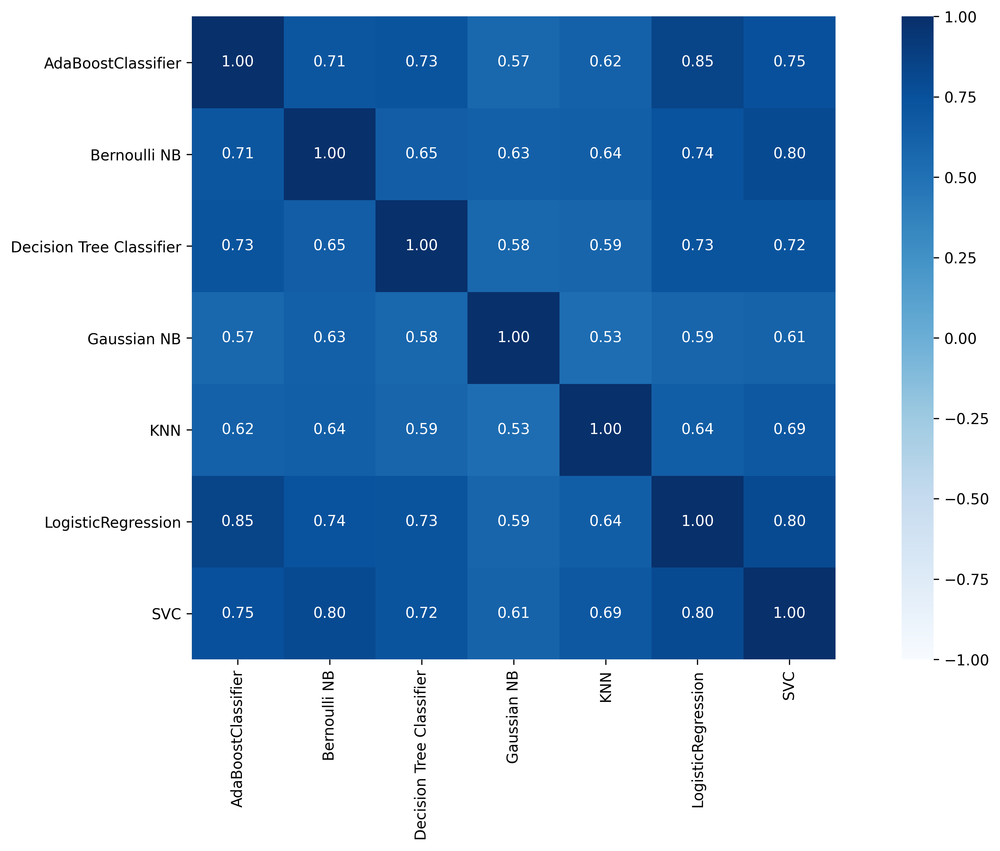

,AdaBoostClassifier,Bernoulli NB,Decision Tree Classifier,Gaussian NB,KNN,LogisticRegression,SVC
AdaBoostClassifier,1.00,0.71,0.73,0.57,0.62,0.85,0.75
Bernoulli NB,0.71,1.00,0.65,0.63,0.64,0.74,0.80
Decision Tree Classifier,0.73,0.65,1.00,0.58,0.59,0.73,0.72
Gaussian NB,0.57,0.63,0.58,1.00,0.53,0.59,0.61
KNN,0.62,0.64,0.59,0.53,1.00,0.64,0.69
LogisticRegression,0.85,0.74,0.73,0.59,0.64,1.00,0.80
SVC,0.75,0.80,0.72,0.61,0.69,0.80,1.00


In [143]:
from dython.nominal import associations

# Step 1: Instantiate a figure and axis object
fig, ax = plt.subplots(figsize=(16, 8), dpi=300)

# Plot features associations
Xf = pd.DataFrame(newTRAIN_set)
rho = associations(Xf, ax = ax, cmap = "Blues")
rho["corr"].round(2)

** For test analysis

In [144]:
for b in list(newTEST_set.keys()):
    
#     print("Best Score: {:.3f}".format(optimal_model.best_score_))
#     print("Best Parameters: {}".format(optimal_model.best_params_))
    print('model name: ', b)
    cr = classification_report(y_test, newTEST_set['{}'.format(b)])
    print("Classification report: ")
    print(cr)

model name:  AdaBoostClassifier
Classification report: 
              precision    recall  f1-score   support

         0.0       0.65      0.67      0.66     15336
         1.0       0.66      0.64      0.65     15542

    accuracy                           0.65     30878
   macro avg       0.65      0.65      0.65     30878
weighted avg       0.65      0.65      0.65     30878

model name:  Bernoulli NB
Classification report: 
              precision    recall  f1-score   support

         0.0       0.64      0.63      0.64     15336
         1.0       0.64      0.65      0.64     15542

    accuracy                           0.64     30878
   macro avg       0.64      0.64      0.64     30878
weighted avg       0.64      0.64      0.64     30878

model name:  Decision Tree Classifier
Classification report: 
              precision    recall  f1-score   support

         0.0       0.63      0.64      0.64     15336
         1.0       0.64      0.63      0.64     15542

    accuracy  

# ANN

In [147]:
from sklearn.neural_network import MLPClassifier

# pred_val = 
#making a new dataset for training our final model by stacking the predictions on the validation data
train_stack = np.column_stack(list(newTRAIN_set.values()))

paramgrid= {'solver': ['lbfgs'],
            'max_iter': [1000,1100,1200,1300,1400,1500,1600,1700,1800,1900,2000 ], 
            'alpha': 10.0 ** -np.arange(1, 10), 
            'hidden_layer_sizes':np.arange(10, 15),
            'random_state':[0,1,2,3,4,5,6,7,8,9]}
# clf = GridSearchCV(MLPClassifier(), parameters, n_jobs=-1)
print('started with model', estimators[k][0])
final_model = RandomizedSearchCV( MLPClassifier(),
                        param_distributions=paramgrid,
                        n_iter=n_iter,
                        cv=skf,
                        n_jobs=-1,
                        verbose=2,
                        random_state=SEED)

start_time = time.time()

final_model.fit(train_stack, y_val)
print(final_model.score(train_stack, y_val))
print(final_model.best_params_)

started with model SVC
Fitting 5 folds for each of 20 candidates, totalling 100 fits
0.6633028272593561
{'solver': 'lbfgs', 'random_state': 0, 'max_iter': 1200, 'hidden_layer_sizes': 12, 'alpha': 1e-07}


This final model is now ready to be used to make predictions on the test data for the final results.

In [148]:
#making the final test set for our final model by stacking the predictions on the test data
test_stack = np.column_stack(list(newTEST_set.values()))

final_predictions = final_model.predict(test_stack)
cr = classification_report(y_test, final_predictions)
print("Classification report: ")
print(cr)

Classification report: 
              precision    recall  f1-score   support

         0.0       0.65      0.65      0.65     15336
         1.0       0.65      0.65      0.65     15542

    accuracy                           0.65     30878
   macro avg       0.65      0.65      0.65     30878
weighted avg       0.65      0.65      0.65     30878



In [150]:
train_stack.shape

(24476, 7)

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
# from keras.wrappers.scikit_learn import KerasClassifier
# import scikeras
from scikeras.wrappers import KerasClassifier


# Function to create model, required for KerasClassifier
def DL_Model(optimizer='rmsprop', init='glorot_uniform'):
    # create model
    model = Sequential()
    model.add(Dense(12, input_dim=7, kernel_initializer=init, activation='sigmoid'))
    model.add(Dense(8, kernel_initializer=init, activation='sigmoid'))
    model.add(Dropout(0.3))
    model.add(Dense(1, kernel_initializer=init, activation='sigmoid'))
    # Compile model
    model.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])
    return model



clf = KerasClassifier(model= DL_Model, 
                      epochs= 80, 
                      batch_size=40, 
                      verbose= 2)
print(clf.get_params().keys())

# grid search epochs, batch size and optimizer
optimizers = ['rmsprop', 'adam', 'nadam', 'sgd', 'adamax']
init = ['glorot_uniform', 'normal', 'uniform']
epochs = [200] #[100, 150, 200]
batches = [5, 10, 20]
param_grid = dict(optimizer=optimizers,
                  epochs=epochs,
                  batch_size=batches, 
                  model__init=init)


model = GridSearchCV(estimator= clf, param_grid=param_grid) 
#                      n_jobs=-1)
model.fit(train_stack, y_val)

print("Max Accuracy Registred: {} using {}".format(round(model.best_score_,3), model.best_params_))
acc = model.cv_results_['mean_test_score']
hyper = model.cv_results_['params']

for mean, param in zip(acc, hyper):
    print("Overall accuracy of {} % using: {}".format(round(mean, 3), param))

dict_keys(['model', 'build_fn', 'warm_start', 'random_state', 'optimizer', 'loss', 'metrics', 'batch_size', 'validation_batch_size', 'verbose', 'callbacks', 'validation_split', 'shuffle', 'run_eagerly', 'epochs', 'class_weight'])
Epoch 1/200
3916/3916 - 4s - loss: 0.6618 - accuracy: 0.6148 - 4s/epoch - 922us/step
Epoch 2/200
3916/3916 - 3s - loss: 0.6422 - accuracy: 0.6536 - 3s/epoch - 831us/step
Epoch 3/200
3916/3916 - 3s - loss: 0.6405 - accuracy: 0.6561 - 3s/epoch - 832us/step
Epoch 4/200
3916/3916 - 3s - loss: 0.6386 - accuracy: 0.6563 - 3s/epoch - 813us/step
Epoch 5/200
3916/3916 - 3s - loss: 0.6374 - accuracy: 0.6605 - 3s/epoch - 798us/step
Epoch 6/200
3916/3916 - 3s - loss: 0.6383 - accuracy: 0.6592 - 3s/epoch - 839us/step
Epoch 7/200
3916/3916 - 3s - loss: 0.6372 - accuracy: 0.6600 - 3s/epoch - 773us/step
Epoch 8/200
3916/3916 - 3s - loss: 0.6364 - accuracy: 0.6596 - 3s/epoch - 819us/step
Epoch 9/200
3916/3916 - 3s - loss: 0.6376 - accuracy: 0.6596 - 3s/epoch - 842us/step
Epoch

In [ ]:
predictionforest = model.predict(test_stack)
print(confusion_matrix(t_test,predictionforest))
print(classification_report(y_test,predictionforest))
# acc7 = accuracy_score(y_test,predictionforest)

## GA 2

In [ ]:
from tpot import TPOTClassifier
from deap.gp import Primitive


tpot_classifier = TPOTClassifier(generations= 5,
                                 population_size= 24,
                                 offspring_size= 12,
                                 verbosity= 2,
                                 early_stop= 12,
                                 config_dict={'sklearn.ensemble.RandomForestClassifier': parameters}, 
                                 cv = 5, 
                                 scoring = 'accuracy')
start_time = time.time()
print("Commenced Time:", time.strftime("%H:%M:%S", time.gmtime(start_time)))

tpot_classifier.fit(X_train[...,0],y_train)

stop_time = time.time()
print("End Time:", time.strftime("%H:%M:%S", time.gmtime(stop_time)))
#     scores = cross_val_score(optimal_model, X, y, cv=skf, scoring="accuracy")

print("Elapsed Time:", time.strftime("%H:%M:%S", time.gmtime(stop_time - start_time)))

* https://www.kaggle.com/code/anuragbantu/stacking-ensemble-learning-beginner-s-guide
* https://kitchingroup.cheme.cmu.edu/s20-06681/08-nonlinear-sklearn/08-nonlinear-sklearn.html
* https://www.kaggle.com/code/hatone/mlpclassifier-with-gridsearchcv/script
* https://www.includehelp.com/python/how-to-save-dictionaries-through-numpy-save.aspx
* https://www.kaggle.com/code/faressayah/lending-club-loan-defaulters-prediction
* https://www.kaggle.com/code/pierpaolo28/credit-card-fraud-model-tuning
* https://www.section.io/engineering-education/hyperparameter-tuning-of-machine-learning-model-in-python/
* https://www.kaggle.com/code/monster1616/hyperparameter
* https://www.kdnuggets.com/2021/05/deal-with-categorical-data-machine-learning.html

In [ ]:
# Dict = dict()
# c = 0 
# for m in [model1, model2, model3]:
# #     base_model = estimators[m][-1]
#     parameters = model_grids[c][-1]
#     print('started with model', m)
#     hyperparameter_tune(base_model=m, parameters=parameters, n_iter =100, kfold = 10, X=X_train, y=y_train)
#     print('finished with ', m, "\n")
#     c +=1

* Drop selected columns

In [13]:
df_ = df.drop([
            'address', 
             'initial_list_status',
             'emp_title',
             'application_type',
             'verification_status',
             'title',
             'purpose',
             'issue_d',
             'sub_grade',
             'earliest_cr_line'
        ], axis=1)
df_.columns

Index(['loan_amnt', 'term', 'int_rate', 'installment', 'grade', 'emp_length',
       'home_ownership', 'annual_inc', 'loan_status', 'dti', 'open_acc',
       'pub_rec', 'revol_bal', 'revol_util', 'total_acc', 'mort_acc',
       'pub_rec_bankruptcies'],
      dtype='object')

* Visualizing Missing Data 

In [14]:
def visMissData(df_):
    plt.figure(figsize=(10,6))
    sns.displot(
                data=df_.isna().melt(value_name="missing"),
                y="variable",
                hue="missing",
                multiple="fill",
                aspect=1.25
    )
    plt.savefig("vis_missing_data_.png", dpi=200)

<Figure size 720x432 with 0 Axes>

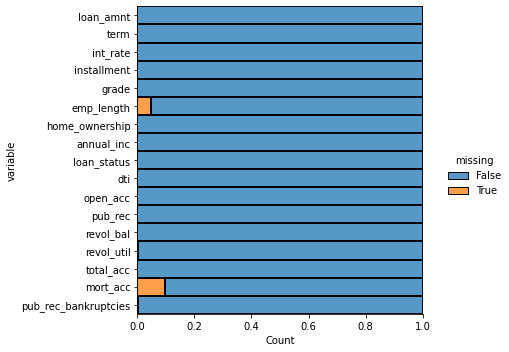

In [15]:
visMissData(df_ = df_)

* remove missing data

<Figure size 720x432 with 0 Axes>

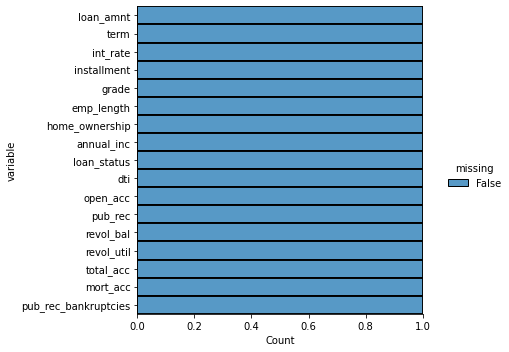

In [16]:
df_.dropna(inplace=True)
visMissData(df_ = df_)

In [17]:
df_.shape

(340775, 17)

#### EDA

* descriptive statistics

In [18]:
# distribution of numerical features 
df_.describe().round(2)

,loan_amnt,int_rate,installment,annual_inc,dti,open_acc,pub_rec,revol_bal,revol_util,total_acc,mort_acc,pub_rec_bankruptcies
count,340775.00,340775.00,340775.00,340775.00,340775.00,340775.00,340775.00,340775.00,340775.00,340775.00,340775.00,340775.00
mean,14542.05,13.80,445.99,76009.78,17.69,11.59,0.19,16226.84,54.36,25.83,1.81,0.13
std,8401.45,4.51,252.38,62105.75,8.15,5.18,0.55,21142.98,23.97,11.90,2.14,0.36
min,1000.00,5.32,21.62,5000.00,0.00,1.00,0.00,0.00,0.00,2.00,0.00,0.00
25%,8000.00,10.64,263.93,47000.00,11.60,8.00,0.00,6302.00,36.90,17.00,0.00,0.00
50%,12500.00,13.35,389.03,65000.00,17.22,11.00,0.00,11487.00,55.30,24.00,1.00,0.00
75%,20000.00,16.78,585.63,90000.00,23.39,14.00,0.00,20015.50,73.00,33.00,3.00,0.00
max,40000.00,30.99,1533.81,8706582.00,380.53,90.00,86.00,1743266.00,892.30,151.00,34.00,8.00


Text(0.5, 1.0, 'Home Ownership vs Annual Income')

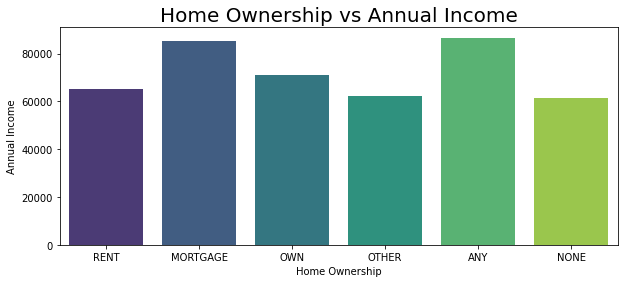

In [19]:
fig, ax =plt.subplots(figsize=(10,4))
sns.barplot(data=df_,x="home_ownership",y='annual_inc',palette='viridis', ci=None)
ax.set(xlabel='Home Ownership', ylabel='Annual Income')
ax.set_title('Home Ownership vs Annual Income', size=20)

In [20]:
df_[['loan_status']]

,loan_status
0,Fully Paid
1,Fully Paid
2,Fully Paid
3,Fully Paid
4,Charged Off
...,...
396024,Fully Paid
396025,Fully Paid
396026,Fully Paid
396027,Fully Paid


In [21]:
data = df_.copy()
data.columns

Index(['loan_amnt', 'term', 'int_rate', 'installment', 'grade', 'emp_length',
       'home_ownership', 'annual_inc', 'loan_status', 'dti', 'open_acc',
       'pub_rec', 'revol_bal', 'revol_util', 'total_acc', 'mort_acc',
       'pub_rec_bankruptcies'],
      dtype='object')

In [22]:
# Assigning loan status variable to a numerical value (binary value)
loan_map = {'loan_status': {'Fully Paid': 0,
                            'Charged Off': 1}
           }
data = df_.copy()
data['loan_status'] = data['loan_status'].map(loan_map['loan_status'])

Ndefault_df = data.loc[data['loan_status'] == 0]
default_df = data.loc[data['loan_status'] == 1]
default_df.head()

,loan_amnt,term,int_rate,installment,grade,emp_length,home_ownership,annual_inc,loan_status,dti,open_acc,pub_rec,revol_bal,revol_util,total_acc,mort_acc,pub_rec_bankruptcies
4,24375.0,60 months,17.27,609.33,C,9 years,MORTGAGE,55000.0,1,33.95,13.0,0.0,24584.0,69.8,43.0,1.0,0.0
26,8400.0,36 months,13.35,284.45,C,6 years,RENT,35000.0,1,23.08,6.0,0.0,6953.0,74.8,17.0,0.0,0.0
48,16000.0,60 months,18.54,411.01,E,3 years,RENT,40000.0,1,37.26,16.0,0.0,13179.0,55.6,20.0,0.0,0.0
54,12000.0,60 months,8.18,244.36,B,7 years,MORTGAGE,60000.0,1,20.34,7.0,0.0,21750.0,59.9,20.0,1.0,0.0
69,3350.0,36 months,15.61,117.14,D,10+ years,MORTGAGE,52000.0,1,4.34,4.0,0.0,787.0,34.2,9.0,1.0,0.0


In [23]:
default_df.shape, Ndefault_df.shape

((67268, 17), (273507, 17))

* Reduce bianess by undersampling Ndefault/ Fully paid DataFrames 

In [24]:
pd.concat?

In [25]:
# Select rows randomly using sample()
df_select_Ndefault= Ndefault_df.sample(n=default_df.shape[0], random_state=SEED)

# merger the 2 DataFrames
df_merged = pd.concat([df_select_Ndefault, default_df], axis=0, ignore_index= True)
df_merged.head()

,loan_amnt,term,int_rate,installment,grade,emp_length,home_ownership,annual_inc,loan_status,dti,open_acc,pub_rec,revol_bal,revol_util,total_acc,mort_acc,pub_rec_bankruptcies
0,18425.0,36 months,15.59,644.05,D,6 years,RENT,57067.0,0,26.62,15.0,0.0,6697.0,90.5,23.0,0.0,0.0
1,8500.0,36 months,6.62,260.99,A,< 1 year,RENT,51000.0,0,8.26,8.0,0.0,4021.0,24.4,14.0,0.0,0.0
2,25000.0,36 months,6.92,771.02,A,9 years,MORTGAGE,105000.0,0,28.51,27.0,0.0,22978.0,23.8,45.0,2.0,0.0
3,8500.0,36 months,6.62,260.99,A,< 1 year,MORTGAGE,50000.0,0,8.26,11.0,0.0,13868.0,34.2,27.0,4.0,0.0
4,18000.0,36 months,14.49,619.49,C,1 year,RENT,55000.0,0,22.28,9.0,0.0,15178.0,48.6,20.0,0.0,0.0


In [26]:
df_merged.shape

(134536, 17)

In [27]:
# encoded= pd.get_dummies(df_[['loan_status']], drop_first=True)
# df_ = pd.concat([df_, encoded], axis=1)
# df_= df_.drop(['loan_status'], axis=1)
# df_.head()

In [28]:
67268*2

134536

In [29]:
#
import matplotlib._color_data as mcd
import random

"""Remember to run the Latex code !!!"""
def make_autopct(values):
    def my_autopct(pct):
        total = sum(values)
        val = int(round(pct*total/100.0))
#         return r'${p:.1f}\%$'.format(p=pct) + '\n' + r'$({v:d})$'.format(v=val)
        return r'${p:.1f}\%$' '\n' r'$({v:d})$'.format(p=pct, v=val)
    return my_autopct
#

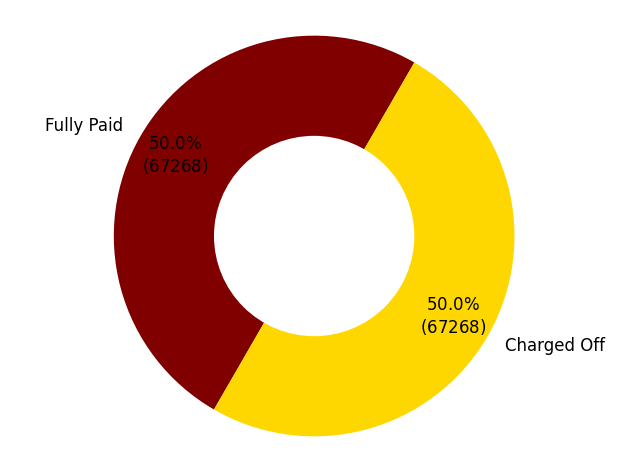

In [30]:
# labels = list(np.unique(df_merged["loan_status"]))
labels = ['Fully Paid', 'Charged Off'] 
sizes = [df_merged["loan_status"].value_counts()[0], df_merged["loan_status"].value_counts()[1]] 
#colors
# colors = ['#f19911',
#           '#99ff99',]
# #           '#99ff99',#66b3ff
# #           '#ffcc99',
# #           '#f19911', 
# #           '#fcee00',#ff9c99
# #           '#b26b6b']

topN = len(labels)
colors = random.sample(population=list(mcd.CSS4_COLORS.keys()), k=topN)
fig1, ax1 = plt.subplots(figsize=(8,6), dpi=80)



patches, texts, autotexts = ax1.pie(sizes,
                                    labels=labels,
                                    autopct=make_autopct(values=sizes),
                                    startangle=60, 
                                    pctdistance=0.80, 
                                    colors = colors,
                                    textprops={'fontsize': 15}) 
# shadow=True,
for k in range(len(labels)):
        texts[k].set_fontsize(15)
        
#draw circle
centre_circle = plt.Circle((0,0),0.50,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

# Equal aspect ratio ensures that pie is drawn as a circle
ax1.axis('equal')  
plt.tight_layout()
plt.savefig('unbaised.pdf', dpi = 200)
plt.savefig('unbaised.png', dpi = 200)

# https://pandas.pydata.org/docs/user_guide/merging.html

In [31]:
# num_df = df_merged.select_dtypes(include=[np.number])
# plt.figure(figsize=(15,15))

# sns.pairplot(data=num_df,
#              hue='loan_status',
#              diag_kind='kde',
#              palette='deep')

In [32]:
# plt.figure(figsize=(15,15))

# sns.pairplot(data=dfcopy,hue='loan_status',diag_kind='kde', palette='deep');

##### Preprocessing

* split features into categorical \& numerical

In [33]:
cat_features = df_merged.select_dtypes(exclude=[np.number])
cat_features.head()

,term,grade,emp_length,home_ownership
0,36 months,D,6 years,RENT
1,36 months,A,< 1 year,RENT
2,36 months,A,9 years,MORTGAGE
3,36 months,A,< 1 year,MORTGAGE
4,36 months,C,1 year,RENT


In [34]:
# cat_features.drop(['earliest_cr_line', 
#          'sub_grade',
#         ], axis=1, inplace=True)
# cat_features.head()

In [35]:
# cat_features.columns[:-1]

In [36]:
# Assigning categorical variables to a numerical value
cat_maps = {'term': {' 36 months': 0,
                     ' 60 months': 1},
           'grade': {'A': 0, 
                     'B': 1,
                     'C': 2,
                     'D': 3, 
                     'E': 4, 
                     'F': 5,
                     'G': 6},
           'emp_length': {'< 1 year': 0,
                          '1 year': 1, 
                          '2 years': 2, 
                          '3 years': 3,
                          '4 years': 4, 
                          '5 years': 5, 
                          '6 years': 6, 
                          '7 years': 7,
                          '8 years': 8, 
                          '9 years': 9, 
                          '10+ years': 10},
            'home_ownership': {'RENT': 0, 
                               'MORTGAGE': 1,
                               'OWN': 2,
                               'OTHER': 3,
                              'NONE': 4,
                               'ANY': 5},
#             'loan_status': {'Fully Paid': 0,
#                             ' Charged Off': 1}
            
           }
data = df_merged.copy()
data['term'] = data['term'].map(cat_maps['term'])
data['grade'] = data['grade'].map(cat_maps['grade'])
data['home_ownership'] = data['home_ownership'].map(cat_maps['home_ownership'])
# data['loan_status'] = data['loan_status'].map(cat_maps['loan_status'])
data['emp_length'] = data['emp_length'].map(cat_maps['emp_length'])
data.head()

,loan_amnt,term,int_rate,installment,grade,emp_length,home_ownership,annual_inc,loan_status,dti,open_acc,pub_rec,revol_bal,revol_util,total_acc,mort_acc,pub_rec_bankruptcies
0,18425.0,0,15.59,644.05,3,6,0,57067.0,0,26.62,15.0,0.0,6697.0,90.5,23.0,0.0,0.0
1,8500.0,0,6.62,260.99,0,0,0,51000.0,0,8.26,8.0,0.0,4021.0,24.4,14.0,0.0,0.0
2,25000.0,0,6.92,771.02,0,9,1,105000.0,0,28.51,27.0,0.0,22978.0,23.8,45.0,2.0,0.0
3,8500.0,0,6.62,260.99,0,0,1,50000.0,0,8.26,11.0,0.0,13868.0,34.2,27.0,4.0,0.0
4,18000.0,0,14.49,619.49,2,1,0,55000.0,0,22.28,9.0,0.0,15178.0,48.6,20.0,0.0,0.0


<Figure size 720x432 with 0 Axes>

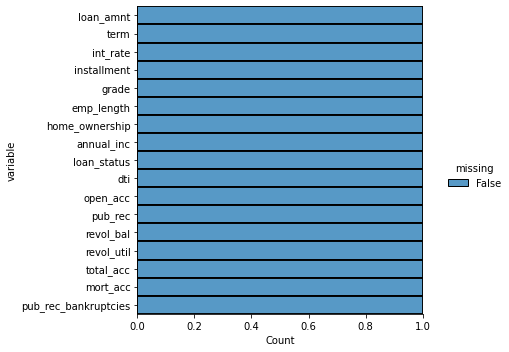

In [37]:
visMissData(df_ = data)

In [38]:
# data.loan_status = (data.loan_status.fillna(1))
# data.isnull().sum()

#### Train test split - stratified splitting (False)

In [39]:
data.columns

Index(['loan_amnt', 'term', 'int_rate', 'installment', 'grade', 'emp_length',
       'home_ownership', 'annual_inc', 'loan_status', 'dti', 'open_acc',
       'pub_rec', 'revol_bal', 'revol_util', 'total_acc', 'mort_acc',
       'pub_rec_bankruptcies'],
      dtype='object')

In [40]:
# data.drop(['earliest_cr_line', 
#          'sub_grade',
#         ], axis=1, inplace=True)
Xe = data.iloc[:, data.columns != 'loan_status']
ye = data['loan_status']

In [41]:
8*9

72

In [42]:
# cols = df_.columns
# num_cols = df_._get_numeric_data().columns
# list(set(cols) - set(num_cols))

In [43]:
# from sklearn.model_selection import train_test_split

# X_train,X_test, y_train,y_test=train_test_split(Xe,
#                                                 ye,
#                                                 test_size=0.2,
#                                                 random_state=42,
#                                                 stratify = ye)

# OR
dfXe = Xe.copy()
dfXe['lb'] = ye
## <<<train, val, test into 60 %, 20 % & 20% resp>>>
trn = 0.60
tst = 0.20
train, validate, test = np.split(dfXe.sample(frac=1, random_state=42), 
                                 [int(trn*len(dfXe)), 
                                  int((trn + tst)*len(dfXe))])
X_train = train.iloc[:, train.columns != 'lb']
X_test = test.iloc[:, test.columns != 'lb'],
X_val = validate.iloc[:, validate.columns != 'lb']
y_train = train['lb']
y_test = test['lb']
y_val = validate['lb']
#. https://datascience.stackexchange.com/questions/15135/train-test-validation-set-splitting-in-sklearn

In [44]:
X_train.shape

(80721, 16)

In [45]:
# y_val

* SMOTE

In [46]:
# """
# Synthetic Minority Oversampling Technique (SMOTE) for handling class imbalance.
# Only numerical features should be inputted with categorical features untouched

# """
# try:
#     from imblearn.over_sampling import SMOTENC
# except:
#     from imblearn.over_sampling import SMOTENC

# smote = SMOTENC(random_state=42, categorical_features=[1, 4, 5, 6,]) # we pass the index of the input numerical features
# X_train , y_train = smote.fit_resample(X_train, y_train)

In [47]:
# X_train.head()

In [48]:
# smote = SMOTENC(random_state=42, categorical_features=[1, 4, 5, 6,]) # we pass the index of the input numerical features
# X_train = X_train._get_numeric_data()
# X_train , y_train = smote.fit_resample(X_train, y_train)

* One hot Encoding

In [49]:
categoric_columns = cat_features.columns
list(categoric_columns)

['term', 'grade', 'emp_length', 'home_ownership']

In [50]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer
# Encoding multiple columns. Unfortunately you cannot pass a list here so you need to copy-paste all printed categorical columns.
transformer = make_column_transformer(
                                        (OneHotEncoder(handle_unknown='ignore'),
                                         ['term', 'grade', 'emp_length', 'home_ownership'])
                                     )

* X_train encoding

In [51]:
X_train.columns

Index(['loan_amnt', 'term', 'int_rate', 'installment', 'grade', 'emp_length',
       'home_ownership', 'annual_inc', 'dti', 'open_acc', 'pub_rec',
       'revol_bal', 'revol_util', 'total_acc', 'mort_acc',
       'pub_rec_bankruptcies'],
      dtype='object')

In [52]:
# Transforming
transformed = transformer.fit_transform(X_train)

# Transformating back
transformed_df = pd.DataFrame(transformed.toarray(),
                              columns=list(transformer.get_feature_names_out()))

# One-hot encoding removed an index. Let's put it back:
transformed_df.index = X_train.index

# Joining tables
X_train = pd.concat([X_train, transformed_df], axis=1)

# Dropping old categorical columns
X_train.drop(list(categoric_columns), axis=1, inplace=True)

* X_test encoding

In [53]:
X_test[0]

,loan_amnt,term,int_rate,installment,grade,emp_length,home_ownership,annual_inc,dti,open_acc,pub_rec,revol_bal,revol_util,total_acc,mort_acc,pub_rec_bankruptcies
62104,21975.0,0,13.65,747.33,2,3,1,50000.0,17.01,5.0,0.0,15269.0,66.4,13.0,0.0,0.0
50649,20000.0,0,12.69,670.90,2,10,0,116272.0,13.54,7.0,0.0,14868.0,95.3,13.0,1.0,0.0
85201,35000.0,1,16.99,869.66,3,10,0,100000.0,20.97,27.0,0.0,33672.0,24.0,50.0,0.0,0.0
40894,18000.0,0,14.33,618.09,2,5,1,80000.0,31.80,14.0,0.0,27291.0,95.8,39.0,2.0,0.0
118547,17000.0,1,14.65,401.32,2,10,0,52000.0,11.45,15.0,1.0,17133.0,56.5,47.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110268,25600.0,1,15.61,617.25,3,8,1,76000.0,23.51,18.0,0.0,21765.0,62.0,40.0,6.0,0.0
119879,35000.0,0,17.86,1262.88,3,10,2,220000.0,14.82,16.0,0.0,27511.0,74.8,29.0,1.0,0.0
103694,8000.0,0,14.09,273.78,1,9,2,40000.0,8.28,10.0,0.0,8741.0,45.3,32.0,0.0,0.0
131932,32000.0,1,19.19,833.45,4,2,2,70000.0,16.89,15.0,0.0,23327.0,26.1,25.0,0.0,0.0


In [54]:
# pd.DataFrame(list(X_test))

In [55]:
# Transforming
transformed = transformer.transform(X_test[0])

# Transformating back
transformed_df = pd.DataFrame(transformed.toarray(),
                              columns=transformer.get_feature_names_out())

# One-hot encoding removed an index. Let's put it back:
transformed_df.index = X_test[0].index

# Joining tables
X_test = pd.concat([X_test[0], transformed_df], axis=1)

# Dropping old categorical columns
X_test.drop(categoric_columns, axis=1, inplace=True)

* X_val encoding

In [56]:
# Transforming
transformed = transformer.transform(X_val)

# Transformating back
transformed_df = pd.DataFrame(transformed.toarray(),
                              columns=transformer.get_feature_names_out())

# One-hot encoding removed an index. Let's put it back:
transformed_df.index = X_val.index

# Joining tables
X_val = pd.concat([X_val, transformed_df], axis=1)

# Dropping old categorical columns
X_val.drop(categoric_columns, axis=1, inplace=True)

In [57]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

# fit the scaler to the train set, it will learn the parameters
scaler.fit(X_train)

# transform train and test sets
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)
X_val_scaled = scaler.transform(X_val)

In [58]:
# y_test

In [61]:
#importing the packages
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
import xgboost as xgb

#specifying the initial learners
# model1 = RandomForestClassifier()
# model2 = LogisticRegression()
# model3 = xgb.XGBClassifier()

# model1 = AdaBoostClassifier(random_state=13)
# model2 = BernoulliNB() 
# model3 = DecisionTreeClassifier(random_state=13)
# model4 = GaussianNB()


model1 = GaussianNB()
model2 = KNeighborsClassifier()
model3 = RandomForestClassifier()
# Model tune parameters
model_grids = [
                
#                   [{'n_estimators' : [800, 1000, 1200], 
#                      'learning_rate' : [1e-3, 1e-2, 5e-2, 1e-1, 5e-1, 1, 1e1],
#                      'random_state':[0]}],                                         #AdaBoost
    
#                   [{'alpha': [1e-2, 1e-1, 1, 1e1, 1e2]}],                          #BernoulliNB
                
#                 [{'criterion':['gini','entropy'],
#                  'random_state':[0], 
#                  'max_depth' : [3, 5, 8, 10, 15, None], 
#                  'min_samples_split' : [1,2,5,10,15,30],
#                  'min_samples_leaf': [1,2,5,10], 
#                  'max_features': ['log2', 'sqrt', None]}],                          #Decision Tree
                
                [{'var_smoothing': [1e-10, 1e-09, 1e-8, 1e-7]}],                    #GaussianNB
                
#                 [{'learning_rate': [0.01, 0.05, 0.1, 0.2], 
#                  'n_estimators': [1000],
#                  'random_state':[0],
#                  'max_depth' : [5, 8, 15, None], 
#                  'min_samples_split' : [1,2,5,10],
#                  'min_samples_leaf': [1,2,5,10], 
#                  'max_features': ['log2', 'sqrt', 'auto', 'None']}],                #Gradient Bossting Decision Tree
                
                [{'n_neighbors':[5,7,9,11, 13, 15, 17, 19], 
                 'metric': ['euclidean', 'manhattan', 'minkowski']}],               #KNN 
    
#                [{'C':[1e-3, 5e-3, 1e-2, 5e-2, 1e-1, 5e-1, 1, 5, 1e1, 5e1, 1e2, 5e2, 1e3],
#                  'random_state':[0]}],                                              #logistic regression
                              
               
               [{'criterion':['gini','entropy'],
                 'n_estimators': [25, 50, 100, 200, 500, 1000],
                 'random_state':[0], 
                 'max_depth' : [3, 5, 8, 10, 15, None], 
                 'min_samples_split' : [1,2,5,10,15,30],
                 'min_samples_leaf': [1,2,5,10], 
                 'max_features': ['log2', 'sqrt', None]}],                           #Random Forest

#                [{'n_estimators':[1000],
#                  'criterion':['gini','entropy'],
#                  'random_state':[0],
#                  'max_depth': [3, 5, 8, 10, 15, 30],
#                  'min_child_weight': [2,4,6,8,10],
#                  'gamma': [0, 0.1, 0.2, 0.3],
#                  'reg_alpha':[0, 0.001, 0.005, 0.01, 0.05],
#                  'colsample_bytree': [0.6, 0.7, 0.8, 0.9],
#                  'eta': [0.1, 0.2, 0.3, 0.4, 0.5]}],                                  #XGBoost           
                        

#                [{'C':[1e-1, 1, 1e1] ,
#                  'random_state':[0],
#                  'kernel': ['rbf', 'poly']
#                 }],                                                                #SVM
               
             
]     

#training the initial learners
# model1.fit(X_train_scaled,y_train)
# model2.fit(X_train_scaled,y_train)
# model3.fit(X_train_scaled,y_train)
# model4.fit(X_train_scaled,y_train)

The initial learners will now be used to make predictions on the validation data (which will be stacked together to form the training data for the final model) and to make predictions on the test data (which will be stacked together to form the test data for the final model).

In [67]:
#making predictions for the validation data
preds1 = model1.predict(X_val)
preds2 = model2.predict(X_val)
preds3 = model3.predict(X_val)

#making predictions for the test data
test_preds1 = model1.predict(X_test)
test_preds2 = model2.predict(X_test)
test_preds3 = model3.predict(X_test)

/home/laklevi1/anarh/projectA/env/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
/home/laklevi1/anarh/projectA/env/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LogisticRegression was fitted without feature names
  warnings.warn(
/home/laklevi1/anarh/projectA/env/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
/home/laklevi1/anarh/projectA/env/lib/python3.8/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LogisticRegression was fitted without feature names
  warnings.warn(


1. The predictions on the validation data will be stacked together to create the train set for the final model.
2. The predictions on the test data will be stacked together to create the test set for the final model.

In [68]:
#making a new dataset for training our final model by stacking the predictions on the validation data
train_stack = np.column_stack((preds1,preds2,preds3))

#making the final test set for our final model by stacking the predictions on the test data
test_stack = np.column_stack((test_preds1,test_preds2,test_preds3))

The final model (meta model) will be created and trained on the predictions of the models on the validation data. We will choose a random forrest classifier for this task.

In [69]:
final_model = RandomForestClassifier()

#training the final model on the stacked predictions
final_model.fit(train_stack,y_val)

RandomForestClassifier()

This final model is now ready to be used to make predictions on the test data for the final results.

In [70]:
final_predictions = final_model.predict(test_stack)

In [73]:
cr = classification_report(y_test, final_predictions)
print("Classification report: ")
print(cr)

Classification report: 
              precision    recall  f1-score   support

           0       0.51      0.52      0.52     13409
           1       0.51      0.50      0.51     13499

    accuracy                           0.51     26908
   macro avg       0.51      0.51      0.51     26908
weighted avg       0.51      0.51      0.51     26908



### New test

In [77]:
SEED = 42
def hyperparameter_tune(base_model, parameters, n_iter, kfold, X=X_train, y=y_train):
    start_time = time.time()
    
    # Arrange data into folds with approx equal proportion of classes within each fold
#     k = StratifiedKFold(n_splits=kfold, shuffle=False)
    
    optimal_model = RandomizedSearchCV(base_model,
                                        param_distributions=parameters,
                                        n_iter=n_iter,
                                        cv=skf,
                                        n_jobs=-1,
                                        verbose=2,
                                        random_state=SEED)
    
    start = time.time()
    optimal_model.fit(X, y)
    print("RandomizedSearchCV took %.2f seconds for %d candidates"
      " parameter settings." % ((time.time() - start), n_iter))
    y_pred = optimal_model.predict(X_test)
    
    stop_time = time.time()

#     scores = cross_val_score(optimal_model, X, y, cv=skf, scoring="accuracy")
    
    print("Elapsed Time:", time.strftime("%H:%M:%S", time.gmtime(stop_time - start_time)))
    print("====================")
#     print("Cross Val Mean: {:.3f}, Cross Val Stdev: {:.3f}".format(scores.mean(), scores.std()))
    print("Best Score: {:.3f}".format(optimal_model.best_score_))
    print("Best Parameters: {}".format(optimal_model.best_params_))
    cr = classification_report(y_test, y_pred)
    print("Classification report: ")
    print(cr)

In [76]:
model1.base_estimator

DecisionTreeClassifier()

In [ ]:
c = 0 
for m in [model1, model2, model3]:
#     base_model = estimators[m][-1]
    parameters = model_grids[c][-1]
    print('started with model', m)
    hyperparameter_tune(base_model=m, parameters=parameters, n_iter =100, kfold = 10, X=X_train, y=y_train)
    print('finished with ', m, "\n")
    c +=1

started with model GaussianNB()
Fitting 5 folds for each of 4 candidates, totalling 20 fits


/home/laklevi1/anarh/projectA/env/lib/python3.8/site-packages/sklearn/model_selection/_search.py:306: UserWarning: The total space of parameters 4 is smaller than n_iter=100. Running 4 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


RandomizedSearchCV took 2.12 seconds for 100 candidates parameter settings.
Elapsed Time: 00:00:02
Best Score: 0.645
Best Parameters: {'var_smoothing': 1e-10}
Classification report: 
              precision    recall  f1-score   support

           0       0.64      0.69      0.66     13409
           1       0.66      0.62      0.64     13499

    accuracy                           0.65     26908
   macro avg       0.65      0.65      0.65     26908
weighted avg       0.65      0.65      0.65     26908

finished with  GaussianNB() 

started with model KNeighborsClassifier()
Fitting 5 folds for each of 24 candidates, totalling 120 fits


/home/laklevi1/anarh/projectA/env/lib/python3.8/site-packages/sklearn/model_selection/_search.py:306: UserWarning: The total space of parameters 24 is smaller than n_iter=100. Running 24 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


RandomizedSearchCV took 247.20 seconds for 100 candidates parameter settings.


In [91]:
y_train, y_test

(84908     1
 103919    1
 75814     1
 90601     1
 59733     0
          ..
 49843     0
 72966     1
 13544     0
 73157     1
 128799    1
 Name: lb, Length: 80721, dtype: int64,
 62104     0
 50649     0
 85201     1
 40894     0
 118547    1
          ..
 110268    1
 119879    1
 103694    1
 131932    1
 121958    1
 Name: lb, Length: 26908, dtype: int64)

# GridSearch

In [62]:
from sklearn.model_selection import GridSearchCV,\
RandomizedSearchCV

In [98]:
param_grid = {
                'n_estimators': [25, 50, 100, 150],
                'max_features': ['sqrt', 'log2', None],
                'max_depth': [3, 6, 9],
                'max_leaf_nodes': [3, 6, 9],
            }

In [100]:
GridSearchCV??

In [105]:
grid_search = GridSearchCV(RandomForestClassifier(),
                           param_grid=param_grid,
                          cv=skf,
                          n_jobs=-1,
                         verbose=2,
                          )
grid_search.fit(X_train, y_train)
print(grid_search.best_estimator_)
print(grid_search.best_score_)

Fitting 5 folds for each of 108 candidates, totalling 540 fits
RandomForestClassifier(max_depth=6, max_features='log2', max_leaf_nodes=9,
                       n_estimators=150)
0.6492114612034581


In [110]:
# grid_search.get_params

In [108]:
# predict the mode
y_predd = grid_search.best_estimator_.predict(X_test)
  
# performance evaluatio metrics
print(classification_report(y_predd, y_test))

              precision    recall  f1-score   support

           0       0.63      0.66      0.65     12930
           1       0.67      0.65      0.66     13978

    accuracy                           0.65     26908
   macro avg       0.65      0.65      0.65     26908
weighted avg       0.65      0.65      0.65     26908



In [68]:
#Hyperparamter tuning using Gridsearch
svm = SVC()
# param_grid = {'C':[0.01,0.05,0.1,1,10, 100, 1000],'kernel':['linear','rbf'], 'gamma':['scale','auto'] }
param_grid = {'C': [0.1, 1, 10, 100, 1000],
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf','linear']
             }
grid_search = GridSearchCV(svm,
                           param_grid,
                           cv=skf,
                           n_jobs=-1,
                          verbose=2,)
grid_search.fit(X_train, y_train)
print(grid_search.best_estimator_)
print(grid_search.best_score_)

Fitting 5 folds for each of 50 candidates, totalling 250 fits


KeyboardInterrupt: 

In [ ]:
# predict the mode
y_predd = grid_search.best_estimator_.predict(X_test)
  
# performance evaluatio metrics
print(classification_report(y_predd, y_test))

In [ ]:
svc.get_params()

In [ ]:
from sklearn.model_selection import LearningCurveDisplay, ShuffleSplit

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 6), sharey=True)

common_params = {
    "X": X_train,
    "y": y_train,
    "train_sizes": np.linspace(0.1, 1.0, 5),
    "cv": ShuffleSplit(n_splits=50, test_size=0.2, random_state=0),
    "score_type": "both",
    "n_jobs": 4,
    "line_kw": {"marker": "o"},
    "std_display_style": "fill_between",
    "score_name": "Accuracy",
}

for ax_idx, estimator in enumerate([svm]):
    LearningCurveDisplay.from_estimator(estimator, **common_params, ax=ax[ax_idx])
    handles, label = ax[ax_idx].get_legend_handles_labels()
    ax[ax_idx].legend(handles[:2], ["Training Score", "Test Score"])
    ax[ax_idx].set_title(f"Learning Curve for {estimator.__class__.__name__}")

In [1]:
8*9

72

## Bayesian Optimisation

In [72]:
# !pip install scikit-optimize

     |████████████████████████████████| 100 kB 466 kB/s ta 0:00:01


In [73]:
#importing skopt library for optimization
import skopt

In [76]:
# X_train

In [ ]:
rf_clf = RandomForestClassifier()

#parameter grid dictionary
params = {
   'n_estimators': [int(x) for x in np.linspace(50,1000, num=20)], #this return a list with 20 equally spaced numbers between 50 and 1000
   'max_features': [len(X_train.columns), "sqrt", "log2"],
   'max_depth': [int(x) for x in np.linspace(5,50,num=10)],
   'min_samples_split': [3,4,6,7,8,9,10],
   'min_samples_leaf': [1,3,5,7,9,10],
   'bootstrap': [True,False]
    
}

#here I am using n_iter = 50 only you can choose more
gs = skopt.BayesSearchCV(n_iter=50,
                         estimator=rf_clf,
                         search_spaces=params,
                         optimizer_kwargs={'base_estimator': 'RF'},
                         cv=5,
                         n_jobs = -1)
print(gs)
#fit our traing data to BayesSearchCV
gs.fit(X_train,y_train)
best_est = gs.best_estimator_
best_score = gs.best_score_
print(f"Best Estimator is : {best_est}")
print(f"Best Score is : {best_score}")

BayesSearchCV(cv=5, estimator=RandomForestClassifier(), n_jobs=-1,
              optimizer_kwargs={'base_estimator': 'RF'},
              search_spaces={'bootstrap': [True, False],
                             'max_depth': [5, 10, 15, 20, 25, 30, 35, 40, 45,
                                           50],
                             'max_features': [37, 'sqrt', 'log2'],
                             'min_samples_leaf': [1, 3, 5, 7, 9, 10],
                             'min_samples_split': [3, 4, 6, 7, 8, 9, 10],
                             'n_estimators': [50, 100, 150, 200, 250, 300, 350,
                                              400, 450, 500, 550, 600, 650, 700,
                                              750, 800, 850, 900, 950, 1000]})


/home/laklevi1/anarh/projectA/env/lib/python3.8/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


In [78]:
print(f"Best Score is : {best_score}")

Best Score is : 0.6571276604397523


In [80]:
yp = gs.predict(X_test)
print(classification_report(y_test, yp))

              precision    recall  f1-score   support

           0       0.66      0.65      0.66     13409
           1       0.66      0.67      0.66     13499

    accuracy                           0.66     26908
   macro avg       0.66      0.66      0.66     26908
weighted avg       0.66      0.66      0.66     26908



In [81]:
gs.cv_results_

{'mean_fit_time': array([  4.8466804 , 183.37476983,  97.30165172,  12.40714741,
        176.2806263 , 110.4681015 ,  96.38273773,  67.27387691,
        113.87312436,  21.3023613 , 116.33926497, 492.73005509,
         91.74433208, 205.9104671 ,   8.96973591,  74.8143599 ,
         42.34549336, 113.39246202, 189.0226356 , 160.93964181,
        531.01690087, 943.43123031,   6.65275612, 903.85677915,
        606.39382133, 580.34769292, 537.36751146, 581.02668037,
        435.68682733, 377.48831391, 611.73439775, 556.37406101,
        165.94180384, 165.45110636, 584.02455196, 153.35887036,
        336.87110252, 203.46828351, 149.13931985,  76.83681769,
        616.20062256, 296.83669481, 165.88832278, 406.97004213,
        606.54050989, 191.9085814 , 537.46822209, 193.02153831,
        192.36289163, 531.94477901]),
 'std_fit_time': array([1.44099054e-02, 7.64354351e-01, 2.13771321e-01, 9.44044626e-02,
        2.28651398e-01, 3.80306300e-01, 2.15975120e-01, 2.06228795e-01,
        4.5003897

<AxesSubplot:xlabel='param_min_samples_split', ylabel='param_max_depth'>

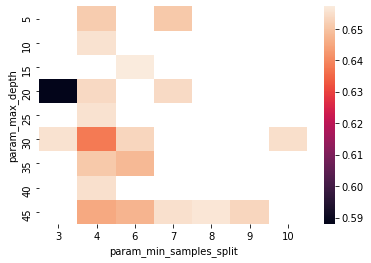

In [82]:
table = pd.pivot_table(pd.DataFrame(gs.cv_results_),
                        values='mean_test_score',
                       index='param_max_depth',
                       columns='param_min_samples_split')
     
sns.heatmap(table)

<AxesSubplot:xlabel='param_min_samples_leaf', ylabel='param_n_estimators'>

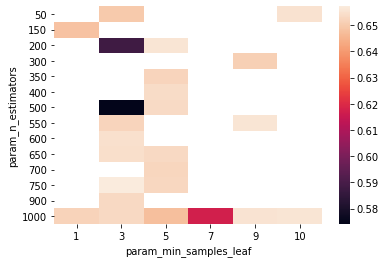

In [84]:
table = pd.pivot_table(pd.DataFrame(gs.cv_results_),
                                    values='mean_test_score',
                                       index='param_n_estimators', 
                                   columns='param_min_samples_leaf')
     
sns.heatmap(table)

* https://www.kaggle.com/code/pranjalsoni17/hyperparameter-tuning-in-machine-learning
* https://www.kaggle.com/code/pierpaolo28/credit-card-fraud-model-tuning

# GA

In [85]:
parameters = {'criterion': ['entropy', 'gini'],
               'max_depth': list(np.linspace(10, 1200, 10, dtype = int)) + [None],
               'max_features': ['auto', 'sqrt','log2', None],
               'min_samples_leaf': [4, 12],
               'min_samples_split': [5, 10],
               'n_estimators': list(np.linspace(151, 1200, 10, dtype = int))}

In [89]:
from tpot import TPOTClassifier
from deap.gp import Primitive


tpot_classifier = TPOTClassifier(generations= 5,
                                 population_size= 24,
                                 offspring_size= 12,
                                 verbosity= 2,
                                 early_stop= 12,
                                 config_dict={'sklearn.ensemble.RandomForestClassifier': parameters}, 
                                 cv = 5, 
                                 scoring = 'accuracy')
start_time = time.time()
print("Commenced Time:", time.strftime("%H:%M:%S", time.gmtime(start_time)))

tpot_classifier.fit(X_train,y_train)

stop_time = time.time()
print("End Time:", time.strftime("%H:%M:%S", time.gmtime(stop_time)))
#     scores = cross_val_score(optimal_model, X, y, cv=skf, scoring="accuracy")

print("Elapsed Time:", time.strftime("%H:%M:%S", time.gmtime(stop_time - start_time)))

In [91]:
X_train_scaled.shape

(80721, 37)

In [92]:
X_train_scaled

array([[-0.29031611,  0.94715571,  0.01454069, ..., -0.32159639,
        -0.00787055, -0.00931268],
       [-1.17605193, -0.4338144 , -1.13929401, ..., -0.32159639,
        -0.00787055, -0.00931268],
       [ 0.59541971,  0.19587323,  0.10778707, ..., -0.32159639,
        -0.00787055, -0.00931268],
       ...,
       [ 0.83161593, -1.36748917,  0.94640933, ..., -0.32159639,
        -0.00787055, -0.00931268],
       [ 0.24112539, -1.256751  ,  0.33709382, ..., -0.32159639,
        -0.00787055, -0.00931268],
       [ 1.91811854,  0.83858888,  2.70507578, ..., -0.32159639,
        -0.00787055, -0.00931268]])

## Artificial Neural Networks (ANNs) Tuning

Using KerasClassifier wrapper, it is possible to apply Grid Search and Random Search for Deep Learning models in the same way it was done when using Sklearn Machine Learning models. More examples are available here:

https://machinelearningmastery.com/grid-search-hyperparameters-deep-learning-models-python-keras/

In [98]:
Dense??

In [116]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
# from keras.wrappers.scikit_learn import KerasClassifier
# import scikeras
from scikeras.wrappers import KerasClassifier

# def DL_Model(activation= 'linear', neurons= 5, optimizer='Adam'):
#     model = Sequential()
#     model.add(Dense(neurons, input_dim= 37, activation= activation))
#     model.add(Dense(neurons, activation= activation))
#     model.add(Dropout(0.3))
#     model.add(Dense(1, activation='sigmoid'))
#     model.compile(loss='binary_crossentropy', optimizer= optimizer, metrics=['accuracy'])
#     return model

# Function to create model, required for KerasClassifier
def DL_Model(optimizer='rmsprop', init='glorot_uniform'):
    # create model
    model = Sequential()
    model.add(Dense(12, input_dim=37, kernel_initializer=init, activation='relu'))
    model.add(Dense(8, kernel_initializer=init, activation='relu'))
    model.add(Dropout(0.3))
    model.add(Dense(1, kernel_initializer=init, activation='sigmoid'))
    # Compile model
    model.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])
    return model

# # Definying grid parameters
# activation = ['softmax', 'relu', 'tanh', 'sigmoid', 'linear']
# neurons = [5, 10, 15, 25, 35, 50]
# optimizer = ['SGD', 'Adam', 'Adamax']
# param_grid = dict(activation = activation, 
#                   neurons = neurons, 
#                   optimizer = optimizer)

clf = KerasClassifier(model= DL_Model, 
                      epochs= 80, 
                      batch_size=40, 
                      verbose= 2)
print(clf.get_params().keys())

# grid search epochs, batch size and optimizer
optimizers = ['rmsprop', 'adam']
init = ['glorot_uniform', 'normal', 'uniform']
epochs = [50, 100, 150]
batches = [5, 10, 20]
param_grid = dict(optimizer=optimizers,
                  epochs=epochs,
                  batch_size=batches, 
                  model__init=init)


model = GridSearchCV(estimator= clf, param_grid=param_grid) 
#                      n_jobs=-1)
model.fit(X_train_scaled, y_train)

print("Max Accuracy Registred: {} using {}".format(round(model.best_score_,3), model.best_params_))
acc = model.cv_results_['mean_test_score']
hyper = model.cv_results_['params']

for mean, param in zip(acc, hyper):
    print("Overall accuracy of {} % using: {}".format(round(mean, 3), param))

dict_keys(['model', 'build_fn', 'warm_start', 'random_state', 'optimizer', 'loss', 'metrics', 'batch_size', 'validation_batch_size', 'verbose', 'callbacks', 'validation_split', 'shuffle', 'run_eagerly', 'epochs', 'class_weight'])
Epoch 1/50
12916/12916 - 13s - loss: 0.6460 - accuracy: 0.6394 - 13s/epoch - 1ms/step
Epoch 2/50
12916/12916 - 13s - loss: 0.6391 - accuracy: 0.6514 - 13s/epoch - 997us/step
Epoch 3/50
12916/12916 - 12s - loss: 0.6396 - accuracy: 0.6514 - 12s/epoch - 961us/step
Epoch 4/50
12916/12916 - 13s - loss: 0.6391 - accuracy: 0.6527 - 13s/epoch - 978us/step
Epoch 5/50
12916/12916 - 13s - loss: 0.6391 - accuracy: 0.6523 - 13s/epoch - 997us/step
Epoch 6/50
12916/12916 - 13s - loss: 0.6400 - accuracy: 0.6521 - 13s/epoch - 971us/step
Epoch 7/50
12916/12916 - 13s - loss: 0.6405 - accuracy: 0.6511 - 13s/epoch - 988us/step
Epoch 8/50
12916/12916 - 13s - loss: 0.6408 - accuracy: 0.6522 - 13s/epoch - 1ms/step
Epoch 9/50
12916/12916 - 13s - loss: 0.6426 - accuracy: 0.6518 - 13s/e

Epoch 41/50
12916/12916 - 12s - loss: 0.6420 - accuracy: 0.6509 - 12s/epoch - 965us/step
Epoch 42/50
12916/12916 - 13s - loss: 0.6412 - accuracy: 0.6519 - 13s/epoch - 979us/step
Epoch 43/50
12916/12916 - 13s - loss: 0.6424 - accuracy: 0.6508 - 13s/epoch - 981us/step
Epoch 44/50
12916/12916 - 12s - loss: 0.6414 - accuracy: 0.6515 - 12s/epoch - 966us/step
Epoch 45/50
12916/12916 - 13s - loss: 0.6433 - accuracy: 0.6509 - 13s/epoch - 978us/step
Epoch 46/50
12916/12916 - 13s - loss: 0.6425 - accuracy: 0.6509 - 13s/epoch - 979us/step
Epoch 47/50
12916/12916 - 12s - loss: 0.6435 - accuracy: 0.6498 - 12s/epoch - 962us/step
Epoch 48/50
12916/12916 - 12s - loss: 0.6427 - accuracy: 0.6509 - 12s/epoch - 967us/step
Epoch 49/50
12916/12916 - 12s - loss: 0.6420 - accuracy: 0.6501 - 12s/epoch - 967us/step
Epoch 50/50
12916/12916 - 13s - loss: 0.6439 - accuracy: 0.6496 - 13s/epoch - 973us/step
3229/3229 - 1s - 1s/epoch - 456us/step
Epoch 1/50
12916/12916 - 13s - loss: 0.6508 - accuracy: 0.6312 - 13s/ep

Epoch 33/50
12916/12916 - 13s - loss: 0.6398 - accuracy: 0.6525 - 13s/epoch - 982us/step
Epoch 34/50
12916/12916 - 13s - loss: 0.6392 - accuracy: 0.6519 - 13s/epoch - 980us/step
Epoch 35/50
12916/12916 - 13s - loss: 0.6396 - accuracy: 0.6522 - 13s/epoch - 969us/step
Epoch 36/50
12916/12916 - 13s - loss: 0.6393 - accuracy: 0.6518 - 13s/epoch - 985us/step
Epoch 37/50
12916/12916 - 13s - loss: 0.6404 - accuracy: 0.6526 - 13s/epoch - 978us/step
Epoch 38/50
12916/12916 - 13s - loss: 0.6402 - accuracy: 0.6521 - 13s/epoch - 973us/step
Epoch 39/50
12916/12916 - 13s - loss: 0.6403 - accuracy: 0.6526 - 13s/epoch - 969us/step
Epoch 40/50
12916/12916 - 13s - loss: 0.6405 - accuracy: 0.6527 - 13s/epoch - 982us/step
Epoch 41/50
12916/12916 - 13s - loss: 0.6394 - accuracy: 0.6521 - 13s/epoch - 977us/step
Epoch 42/50
12916/12916 - 12s - loss: 0.6400 - accuracy: 0.6521 - 12s/epoch - 965us/step
Epoch 43/50
12916/12916 - 12s - loss: 0.6400 - accuracy: 0.6522 - 12s/epoch - 965us/step
Epoch 44/50
12916/129

Epoch 25/50
12916/12916 - 13s - loss: 0.6419 - accuracy: 0.6510 - 13s/epoch - 975us/step
Epoch 26/50
12916/12916 - 13s - loss: 0.6394 - accuracy: 0.6519 - 13s/epoch - 980us/step
Epoch 27/50
12916/12916 - 13s - loss: 0.6391 - accuracy: 0.6506 - 13s/epoch - 977us/step
Epoch 28/50
12916/12916 - 12s - loss: 0.6400 - accuracy: 0.6502 - 12s/epoch - 963us/step
Epoch 29/50
12916/12916 - 13s - loss: 0.6413 - accuracy: 0.6508 - 13s/epoch - 971us/step
Epoch 30/50
12916/12916 - 13s - loss: 0.6402 - accuracy: 0.6512 - 13s/epoch - 989us/step
Epoch 31/50
12916/12916 - 13s - loss: 0.6407 - accuracy: 0.6523 - 13s/epoch - 985us/step
Epoch 32/50
12916/12916 - 13s - loss: 0.6406 - accuracy: 0.6527 - 13s/epoch - 977us/step
Epoch 33/50
12916/12916 - 13s - loss: 0.6411 - accuracy: 0.6514 - 13s/epoch - 983us/step
Epoch 34/50
12916/12916 - 13s - loss: 0.6410 - accuracy: 0.6495 - 13s/epoch - 989us/step
Epoch 35/50
12916/12916 - 12s - loss: 0.6412 - accuracy: 0.6505 - 12s/epoch - 963us/step
Epoch 36/50
12916/129

KeyboardInterrupt: 

In [94]:
X_train_scaled

array([[-0.29031611,  0.94715571,  0.01454069, ..., -0.32159639,
        -0.00787055, -0.00931268],
       [-1.17605193, -0.4338144 , -1.13929401, ..., -0.32159639,
        -0.00787055, -0.00931268],
       [ 0.59541971,  0.19587323,  0.10778707, ..., -0.32159639,
        -0.00787055, -0.00931268],
       ...,
       [ 0.83161593, -1.36748917,  0.94640933, ..., -0.32159639,
        -0.00787055, -0.00931268],
       [ 0.24112539, -1.256751  ,  0.33709382, ..., -0.32159639,
        -0.00787055, -0.00931268],
       [ 1.91811854,  0.83858888,  2.70507578, ..., -0.32159639,
        -0.00787055, -0.00931268]])

In [ ]:
predictionforest = model.predict(X_test_scaled)
print(confusion_matrix(t_test,predictionforest))
print(classification_report(y_test,predictionforest))
acc7 = accuracy_score(y_test,predictionforest)

In [99]:
KerasClassifier??

### Model building

In [72]:
from sklearn.metrics import confusion_matrix, recall_score, precision_score, f1_score, accuracy_score, roc_auc_score
from sklearn.metrics import classification_report
from sklearn.metrics import plot_confusion_matrix, roc_auc_score, plot_roc_curve

###  Level-0 with 28 Models

In [33]:
# !pip install catboost

In [60]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.naive_bayes import BernoulliNB
from sklearn.calibration import CalibratedClassifierCV
from sklearn.naive_bayes import CategoricalNB
from sklearn.multioutput import ClassifierChain
from sklearn.naive_bayes import ComplementNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.dummy import DummyClassifier
from sklearn.tree import ExtraTreeClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.semi_supervised import LabelPropagation
from sklearn.semi_supervised import LabelSpreading
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.svm import LinearSVC
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LogisticRegressionCV
from sklearn.neural_network import MLPClassifier
from sklearn.multioutput import MultiOutputClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.neighbors import NearestCentroid
from sklearn.svm import NuSVC
from sklearn.multiclass import OneVsOneClassifier
from sklearn.multiclass import OneVsRestClassifier
from sklearn.multiclass import OutputCodeClassifier
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.linear_model import Perceptron
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.neighbors import RadiusNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import RidgeClassifier
from sklearn.linear_model import RidgeClassifierCV
from sklearn.linear_model import SGDClassifier
from sklearn.svm import SVC
from sklearn.ensemble import StackingClassifier
#from sklearn.ensemble import VotingClassifier

from xgboost import XGBClassifier
from catboost import CatBoostClassifier

In [35]:
estimators = []
estimators.append(('AdaBoostClassifier', AdaBoostClassifier(random_state=13) ))
# estimators.append(('Bagging Classifier', BaggingClassifier(random_state=13) ))
estimators.append(('Bernoulli NB', BernoulliNB() ))
estimators.append(('Decision Tree Classifier', DecisionTreeClassifier(random_state=13) ))
# estimators.append(('Dummy Classifier', DummyClassifier(random_state=13) ))
# estimators.append(('Extra Tree Classifier', ExtraTreeClassifier(random_state=13) ))
# estimators.append(('Extra Trees Classifier', ExtraTreesClassifier(random_state=13) ))
estimators.append(('Gaussian NB', GaussianNB() ))
# estimators.append(('Gaussian Process Classifier', GaussianProcessClassifier(random_state=13) ))
estimators.append(('Gradient Boosting Classifier', GradientBoostingClassifier(random_state=13) ))
# estimators.append(('Hist Gradient Boosting Classifier', HistGradientBoostingClassifier(random_state=13) ))
estimators.append(('KNN', KNeighborsClassifier() ))
#estimators.append(('Label Propagation', LabelPropagation() ))
#estimators.append(('Label Spreading', LabelSpreading() ))
estimators.append(('LogisticRegression', LogisticRegression(max_iter=1000, random_state=13)))
# estimators.append(('Logistic Regression CV', LogisticRegressionCV(max_iter=1000, random_state=13) ))
# estimators.append(('MLPClassifier', MLPClassifier(max_iter=2000,random_state=13) ))
# estimators.append(('Nearest Centroid', NearestCentroid() ))
# estimators.append(('Passive Aggressive Classifier', PassiveAggressiveClassifier(random_state=13) ))
# estimators.append(('Perceptron', Perceptron(random_state=13) ))
#estimators.append(('RadiusNeighborsClassifier', RadiusNeighborsClassifier(radius=3) ))
estimators.append(('RandomForest', RandomForestClassifier(max_depth= 10, min_samples_leaf= 1, min_samples_split= 3, n_estimators= 170, random_state=13) ))
# estimators.append(('Ridge Classifier', RidgeClassifier(random_state=13) ))
# estimators.append(('Ridge Classifier CV', RidgeClassifierCV() ))
# estimators.append(('SGDClassifier', SGDClassifier(random_state=13) ))
estimators.append(('XGB', XGBClassifier(random_state=13) ))
estimators.append(('SVC', SVC(random_state=13)))
# estimators.append(('CatBoost', CatBoostClassifier(logging_level='Silent', random_state=13) ))

# Model tune parameters
model_grids = [
                
                  [{'n_estimators' : [800, 1000, 1200], 
                     'learning_rate' : [1e-3, 1e-2, 5e-2, 1e-1, 5e-1, 1, 1e1],
                     'random_state':[0]}],                                         #AdaBoost
    
                  [{'alpha': [1e-2, 1e-1, 1, 1e1, 1e2]}],                          #BernoulliNB
                
                [{'criterion':['gini','entropy'],
                 'random_state':[0], 
                 'max_depth' : [3, 5, 8, 10, 15, None], 
                 'min_samples_split' : [1,2,5,10,15,30],
                 'min_samples_leaf': [1,2,5,10], 
                 'max_features': ['log2', 'sqrt', None]}],                          #Decision Tree
                
                [{'var_smoothing': [1e-10, 1e-09, 1e-8, 1e-7]}],                    #GaussianNB
                
                [{'learning_rate': [0.01, 0.05, 0.1, 0.2], 
                 'n_estimators': [1000],
                 'random_state':[0],
                 'max_depth' : [5, 8, 15, None], 
                 'min_samples_split' : [1,2,5,10],
                 'min_samples_leaf': [1,2,5,10], 
                 'max_features': ['log2', 'sqrt', 'auto', 'None']}],                #Gradient Bossting Decision Tree
                
                [{'n_neighbors':[5,7,9,11, 13, 15, 17, 19], 
                 'metric': ['euclidean', 'manhattan', 'minkowski']}],               #KNN 
    
               [{'C':[1e-3, 5e-3, 1e-2, 5e-2, 1e-1, 5e-1, 1, 5, 1e1, 5e1, 1e2, 5e2, 1e3],
                 'random_state':[0]}],                                              #logistic regression
                              
               
               [{'criterion':['gini','entropy'],
                 'n_estimators': [1000],
                 'random_state':[0], 
                 'max_depth' : [3, 5, 8, 10, 15, None], 
                 'min_samples_split' : [1,2,5,10,15,30],
                 'min_samples_leaf': [1,2,5,10], 
                 'max_features': ['log2', 'sqrt', None]}],                           #Random Forest

               [{'n_estimators':[1000],
                 'criterion':['gini','entropy'],
                 'random_state':[0],
                 'max_depth': [3, 5, 8, 10, 15, 30],
                 'min_child_weight': [2,4,6,8,10],
                 'gamma': [0, 0.1, 0.2, 0.3],
                 'reg_alpha':[0, 0.001, 0.005, 0.01, 0.05],
                 'colsample_bytree': [0.6, 0.7, 0.8, 0.9],
                 'eta': [0.1, 0.2, 0.3, 0.4, 0.5]}],                                  #XGBoost           
                        

               [{'C':[1e-1, 1, 1e1] ,
                 'random_state':[0],
                 'kernel': ['rbf', 'poly']
                }],                                                                #SVM
               
             
]           

In [36]:
estimators

[('AdaBoostClassifier', AdaBoostClassifier(random_state=13)),
 ('Bernoulli NB', BernoulliNB()),
 ('Decision Tree Classifier', DecisionTreeClassifier(random_state=13)),
 ('Gaussian NB', GaussianNB()),
 ('Gradient Boosting Classifier', GradientBoostingClassifier(random_state=13)),
 ('KNN', KNeighborsClassifier()),
 ('LogisticRegression', LogisticRegression(max_iter=1000, random_state=13)),
 ('RandomForest',
  RandomForestClassifier(max_depth=10, min_samples_split=3, n_estimators=170,
                         random_state=13)),
 ('XGB',
  XGBClassifier(base_score=None, booster=None, colsample_bylevel=None,
                colsample_bynode=None, colsample_bytree=None, gamma=None,
                gpu_id=None, importance_type='gain', interaction_constraints=None,
                learning_rate=None, max_delta_step=None, max_depth=None,
                min_child_weight=None, missing=nan, monotone_constraints=None,
                n_estimators=100, n_jobs=None, num_parallel_tree=None,
         

In [37]:
# estimators

In [38]:
estimators[0]

('AdaBoostClassifier', AdaBoostClassifier(random_state=13))

In [39]:
for p in range(len(estimators)):
    print(estimators[p][-1])

AdaBoostClassifier(random_state=13)
BernoulliNB()
DecisionTreeClassifier(random_state=13)
GaussianNB()
GradientBoostingClassifier(random_state=13)
KNeighborsClassifier()
LogisticRegression(max_iter=1000, random_state=13)
RandomForestClassifier(max_depth=10, min_samples_split=3, n_estimators=170,
                       random_state=13)
XGBClassifier(base_score=None, booster=None, colsample_bylevel=None,
              colsample_bynode=None, colsample_bytree=None, gamma=None,
              gpu_id=None, importance_type='gain', interaction_constraints=None,
              learning_rate=None, max_delta_step=None, max_depth=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              random_state=13, reg_alpha=None, reg_lambda=None,
              scale_pos_weight=None, subsample=None, tree_method=None,
              validate_parameters=None, verbosity=None)
SVC(random_state=13)


In [65]:
from sklearn.model_selection import cross_val_score, GridSearchCV, StratifiedKFold, RandomizedSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score, ConfusionMatrixDisplay, precision_score, recall_score, f1_score, classification_report, roc_curve, plot_roc_curve, auc, precision_recall_curve, plot_precision_recall_curve, average_precision_score

In [66]:
folds = 5

skf = StratifiedKFold(n_splits=folds, shuffle = True, random_state = 1001) 

In [67]:
import time

In [ ]:
lst_1_tuned= []
models_tuned = estimators.copy()

# start_time = time.time()
for m in range(len(models_tuned)):
    start_time = time.time()
    lst_2_tuned= []
    model = models_tuned[m][-1]
    print(r'fitting with : {}'.format(models_tuned[m][0]))
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    accuracies = cross_val_score(estimator = model,
                                 X = X_train,
                                 y = y_train, 
                                 cv = skf,
                                 scoring="accuracy"
                                 )   #K-Fold Validation
    
    test_acc = accuracy_score(y_test, y_pred)

    cr = classification_report(y_test, y_pred)
      
    cm = confusion_matrix(y_test, y_pred)

    precision = precision_score(y_test, y_pred, average= 'weighted')
    recall = recall_score(y_test, y_pred, average= 'weighted')
    f1 = f1_score(y_test, y_pred, average= 'weighted')
    roc = roc_auc_score(y_test, y_pred)

    predicted_probab = model.predict_proba(X_test)
    predicted_probab = predicted_probab[:, 1]

    fpr, tpr, _ = roc_curve(y_test, predicted_probab)
    plt.plot(fpr, tpr, marker='.', label = type(models_tuned[m][-1]).__name__)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend()
   
    print(type(models_tuned[m][-1]).__name__ , ':')
    
    print('Accuracy Score: {:.4f}'.format(test_acc))
    print('')
    
    print("K-Fold Validation Mean Accuracy: {:.4f} %".format(accuracies.mean()*100))
    print('')

    print("Classification report: ")
    print(cr)
    print('')

    print("Confusion matrix: ")
    print(cm)
    print('')

    print('Precision Score: {:.4f}'.format(precision))
    print('')

    print('Recall Score: {:.4f}'.format(recall))
    print('')

    print('F1 score: {:.4f}'.format(f1))
    
    print('-----------------------------------')
    print('')
#     lst_2_tuned.append(type(models_tuned[m][-1]).__name__)
    lst_2_tuned.append(models_tuned[m][0])
    lst_2_tuned.append(accuracies.mean())
    lst_2_tuned.append(test_acc)
    lst_2_tuned.append(precision)
    lst_2_tuned.append(recall)
    lst_2_tuned.append(f1)
    lst_1_tuned.append(lst_2_tuned)
    
    print("====================")
    stop_time = time.time()
    print("Elapsed Time to run {}:".format(type(models_tuned[m][-1]).__name__), time.strftime("%H:%M:%S", time.gmtime(stop_time - start_time)))

In [48]:
SEED = 42
def hyperparameter_tune(base_model, parameters, n_iter, kfold, X=X_train, y=y_train):
    start_time = time.time()
    
    # Arrange data into folds with approx equal proportion of classes within each fold
#     k = StratifiedKFold(n_splits=kfold, shuffle=False)
    
    optimal_model = RandomizedSearchCV(base_model,
                                        param_distributions=parameters,
                                        n_iter=n_iter,
                                        cv=skf,
                                        n_jobs=-1,
                                        verbose=2,
                                        random_state=SEED)
    
    start = time.time()
    optimal_model.fit(X, y)
    print("RandomizedSearchCV took %.2f seconds for %d candidates"
      " parameter settings." % ((time.time() - start), n_iter))
    y_pred = optimal_model.predict(X_test)
    
    stop_time = time.time()

#     scores = cross_val_score(optimal_model, X, y, cv=skf, scoring="accuracy")
    
    print("Elapsed Time:", time.strftime("%H:%M:%S", time.gmtime(stop_time - start_time)))
    print("====================")
#     print("Cross Val Mean: {:.3f}, Cross Val Stdev: {:.3f}".format(scores.mean(), scores.std()))
    print("Best Score: {:.3f}".format(optimal_model.best_score_))
    print("Best Parameters: {}".format(optimal_model.best_params_))
    cr = classification_report(y_test, y_pred)
    print("Classification report: ")
    print(cr)
    
#     return optimal_model.best_params_, optimal_model.best_score_

In [ ]:
model_grids[0][-1]

In [ ]:
for m in range(len(estimators)):
    base_model = estimators[m][-1]
    parameters = model_grids[m][-1]
    print('started with ', estimators[m][0])
    hyperparameter_tune(base_model, parameters, n_iter =5, kfold = 5, X=X_train, y=y_train)
    print('finished with ', estimators[m][0], "\n")

started with  AdaBoostClassifier
Fitting 5 folds for each of 5 candidates, totalling 25 fits
RandomizedSearchCV took 3063.34 seconds for 5 candidates parameter settings.
Elapsed Time: 00:51:15
Best Score: 0.866
Best Parameters: {'random_state': 0, 'n_estimators': 1200, 'learning_rate': 1}
Classification report: 
              precision    recall  f1-score   support

         0.0       0.82      0.96      0.88     54701
         1.0       0.48      0.16      0.24     13454

    accuracy                           0.80     68155
   macro avg       0.65      0.56      0.56     68155
weighted avg       0.75      0.80      0.76     68155

finished with  AdaBoostClassifier
started with  Bernoulli NB
Fitting 5 folds for each of 5 candidates, totalling 25 fits
RandomizedSearchCV took 3.33 seconds for 5 candidates parameter settings.
Elapsed Time: 00:00:03
Best Score: 0.663
Best Parameters: {'alpha': 0.01}
Classification report: 
              precision    recall  f1-score   support

         0.

/home/laklevi1/anarh/projectA/env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 25.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/home/laklevi1/anarh/projectA/env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/home/laklevi1/anarh/projectA/env/lib/python3.8/site-packages/sklearn/tree/_classes.py", line 969, in fit
    super().fit(
  File "/home/laklevi1/anarh/projectA/env/lib/python3.8/site-packages/sklearn/tree/_classes.py", line 265, in fit
    check_scalar(
  File "/

RandomizedSearchCV took 18.72 seconds for 5 candidates parameter settings.
Elapsed Time: 00:00:18
Best Score: 0.822
Best Parameters: {'random_state': 0, 'min_samples_split': 5, 'min_samples_leaf': 10, 'max_features': None, 'max_depth': None, 'criterion': 'entropy'}
Classification report: 
              precision    recall  f1-score   support

         0.0       0.83      0.85      0.84     54701
         1.0       0.31      0.26      0.28     13454

    accuracy                           0.74     68155
   macro avg       0.57      0.56      0.56     68155
weighted avg       0.72      0.74      0.73     68155

finished with  Decision Tree Classifier
started with  Gaussian NB
Fitting 5 folds for each of 4 candidates, totalling 20 fits


/home/laklevi1/anarh/projectA/env/lib/python3.8/site-packages/sklearn/model_selection/_search.py:306: UserWarning: The total space of parameters 4 is smaller than n_iter=5. Running 4 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


RandomizedSearchCV took 2.35 seconds for 5 candidates parameter settings.
Elapsed Time: 00:00:02
Best Score: 0.675
Best Parameters: {'var_smoothing': 1e-10}
Classification report: 
              precision    recall  f1-score   support

         0.0       0.88      0.60      0.71     54701
         1.0       0.29      0.68      0.41     13454

    accuracy                           0.61     68155
   macro avg       0.59      0.64      0.56     68155
weighted avg       0.77      0.61      0.65     68155

finished with  Gaussian NB
started with  Gradient Boosting Classifier
Fitting 5 folds for each of 5 candidates, totalling 25 fits


* https://www.kaggle.com/code/amneves/xgboost-regressor-with-random-search-hypertuning
* https://www.kaggle.com/code/monster1616/hyperparameter

### Level-1 Model

In [ ]:
XGB = XGBClassifier(random_state=13)

### Create a stacking classifier

In [ ]:
from sklearn.ensemble import StackingClassifier
SC = StackingClassifier(estimators=estimators,final_estimator=XGB,cv=6)
SC.fit(X_train, y_train)
y_pred = SC.predict(X_test)

print(f"\nStacking classifier training Accuracy: {SC.score(X_train, y_train):0.2f}")
print(f"Stacking classifier test Accuracy: {SC.score(X_test, y_test):0.2f}")

In [ ]:
SC_Recall = recall_score(y_test, y_pred)
SC_Precision = precision_score(y_test, y_pred)
SC_f1 = f1_score(y_test, y_pred)
SC_accuracy = accuracy_score(y_test, y_pred)
SC_roc_auc = roc_auc_score(y_test, y_pred)

cm = confusion_matrix(y_test, y_pred)
print(cm)

In [ ]:
from statistics import stdev
score = cross_val_score(SC, X_train, y_train, cv=5, scoring='recall', error_score="raise")
SC_cv_score = score.mean()
SC_cv_stdev = stdev(score)
print('Cross Validation Recall scores are: {}'.format(score))
print('Average Cross Validation Recall score: ', SC_cv_score)
print('Cross Validation Recall standard deviation: ', SC_cv_stdev)

In [ ]:
ndf = [(SC_Recall, SC_Precision, SC_f1, SC_accuracy, SC_roc_auc, SC_cv_score, SC_cv_stdev)]

SC_score = pd.DataFrame(data = ndf, columns=['Recall','Precision','F1 Score', 'Accuracy', 'ROC-AUC Score', 'Avg CV Recall', 'Standard Deviation of CV Recall'])
SC_score.insert(0, 'Model', 'Random Forest')
SC_score

### AUC-ROC Curve

In [ ]:
y_proba = SC.predict_proba(X_test)

from sklearn.metrics import roc_curve
from sklearn.metrics import RocCurveDisplay
def plot_auc_roc_curve(y_test, y_pred):
    fpr, tpr, _ = roc_curve(y_test, y_pred)
    roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr).plot()
    roc_display.figure_.set_size_inches(5,5)
    plt.plot([0, 1], [0, 1], color = 'g')
plot_auc_roc_curve(y_test, y_proba[:, 1])

In [ ]:
* https://www.kaggle.com/code/eshaan90/ensembles-and-model-stacking